<h1 style="font-size: 30px;">From Cointegration to Out-of-Sample Failure: A Pairs-Trading Case Study on PEP/KO</h1>

This notebook complements the report *"From Cointegration to Out-of-Sample Failure: A Pairs-Trading Case Study on PEP/KO."* 
Each section opens with a short summary, followed by the derivation, code or result needed to support it. 
Appendix A contains classical results, namely the $AR(1)$ stationarity conditions and a weak-stationarity equivalence, used to justify the analysis.

In [1]:
# Libraries Import
import numpy as np
import pandas as pd
import yfinance as yf
import itertools
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from pathlib import Path
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint
from IPython.display import Markdown, display
from scipy.stats import skew, kurtosis, norm


# Settings
plt.rcParams["text.usetex"] = True      # requires latex installation
plt.rcParams.update({"font.family": "serif",})

%config InlineBackend.figure_format = "retina"     
plt.rcParams["figure.dpi"] = 220        # adjust as needed

folder = Path("PEP-KO Pairs Trading Strategy - Plots")
folder.mkdir(exist_ok=True)
save_plots = False                      # if True, plots are saved in a subfolder

# Statistical Analysis on 2013–2018 Data

We first establish that PEP's and KO's log-price series are each non-stationary ($I(1)$), then test whether a linear combination of them is stationary (cointegration), and finally characterise the mean-reversion speed of the stationary combination. 
These ingredients are needed before the trading rule can be built.


## Historical Prices, Log-Prices and Log-Returns

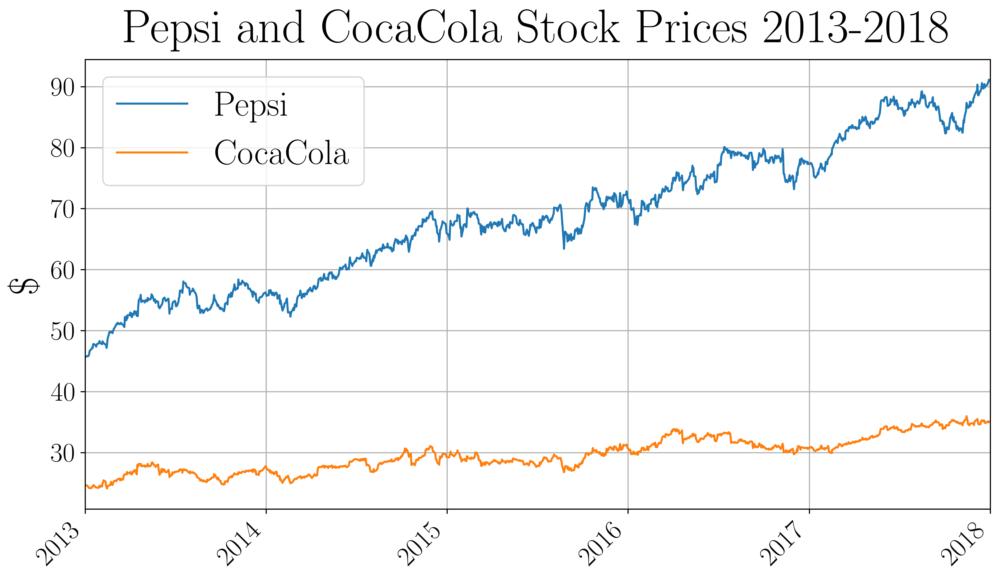

In [2]:
# Retrieve Data and Extract Prices

data = yf.download(
    ["PEP", "KO"],
    start="2013-01-01",
    end="2018-01-01",
    auto_adjust=True,
    progress=False
)

prices = data["Close"]
pep = prices["PEP"].to_numpy()
ko = prices["KO"].to_numpy()
T = len(pep) - 1

# Plot
plt.figure(figsize=(12,6))
plt.plot(prices["PEP"])
plt.plot(prices["KO"])
plt.legend(["Pepsi","CocaCola"],fontsize=26)
plt.title("Pepsi and CocaCola Stock Prices 2013-2018",fontsize=35,y=1.02)
plt.ylabel("$\$$",fontsize=30)
plt.xlim(pd.Timestamp("2013-01-01"), pd.Timestamp("2018-01-01"))
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Historical Prices 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()

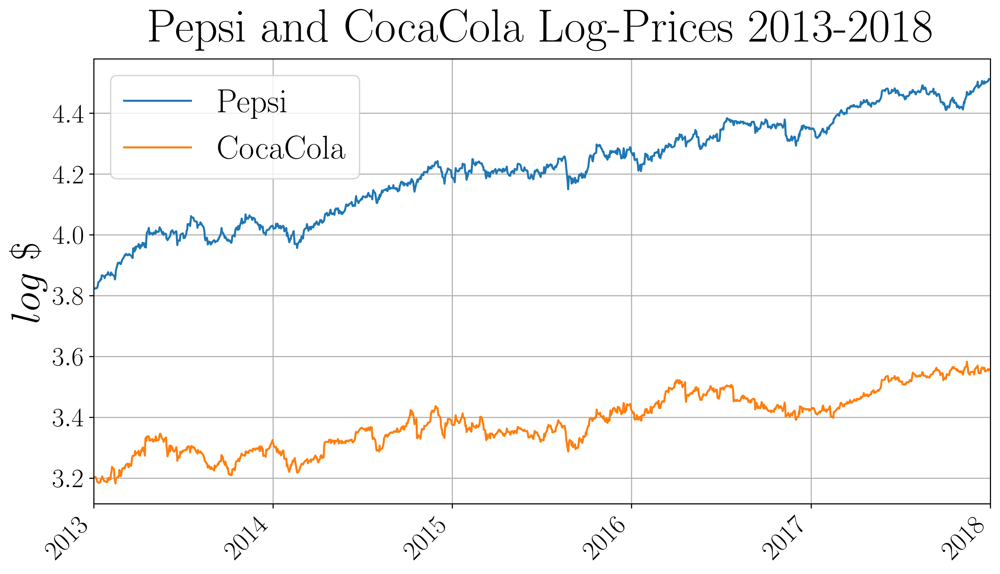

In [3]:
# Log-Prices
pep_log = np.log(pep)
ko_log = np.log(ko)

# Plot
plt.figure(figsize=(12,6))
plt.plot(prices.index,pep_log)
plt.plot(prices.index,ko_log)
plt.title("Pepsi and CocaCola Log-Prices 2013-2018",fontsize=35,y=1.02)
plt.ylabel("$log\ \$$",fontsize=30)
plt.legend(["Pepsi","CocaCola"],fontsize=25)
plt.xlim(pd.Timestamp("2013-01-01"), pd.Timestamp("2018-01-01"))
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Log-Prices 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()

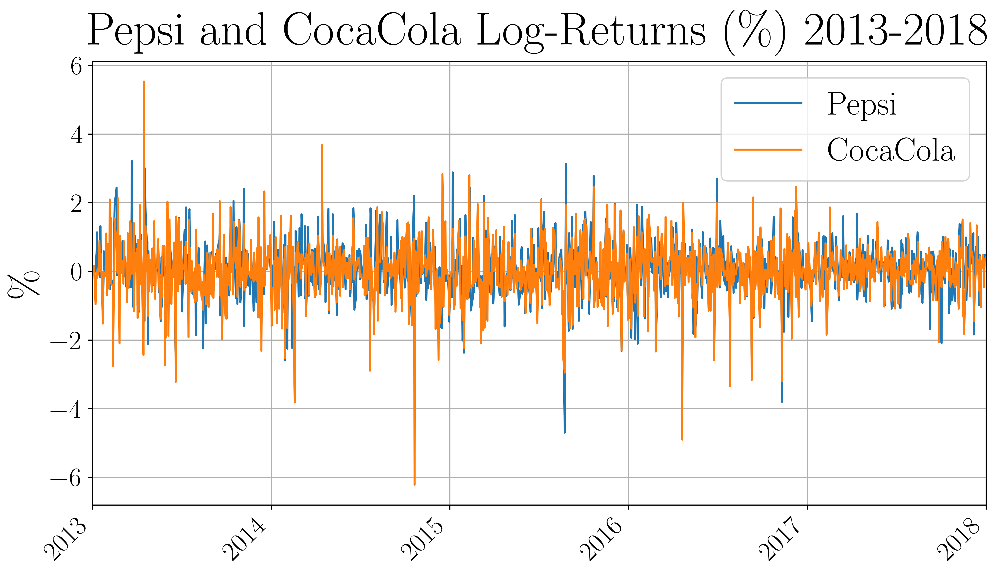

In [4]:
# Log Returns
pep_log_return = np.log(pep[1:]/pep[:-1])
ko_log_return = np.log(ko[1:]/ko[:-1])

# Plot
plt.figure(figsize=(12,6))
plt.plot(prices.index[1:],pep_log_return*100)
plt.plot(prices.index[1:],ko_log_return*100)
plt.title("Pepsi and CocaCola Log-Returns $(\%)$ 2013-2018",fontsize=35,y=1.02)
plt.ylabel("$\%$",fontsize=30)
plt.legend(["Pepsi","CocaCola"],fontsize=25)
plt.xlim(pd.Timestamp("2013-01-01"), pd.Timestamp("2018-01-01"))
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Log-Returns 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()


## Descriptive Statistics: Volatility and Correlation

We summarise the log-return series $\{r_t\}_{t=1}^T$ through two standard descriptive statistics: **volatility** and **correlation**.

**Volatility.** In financial time series analysis, volatility refers to the dispersion of returns around their mean, and is typically quantified by the (sample) standard deviation of $r_t$:
$$
\hat\sigma_r = \sqrt{\frac{1}{T-1}\sum_{t=1}^{T}\left(r_t-\bar r\right)^2}, \qquad \bar r = \frac{1}{T}\sum_{t=1}^T r_t.
$$
Since $\{r_t\}$ consists of *daily* log-returns, $\hat\sigma_r$ is a daily volatility figure.
To compare it against commonly quoted **annualised volatility**, one rescales using the number of trading days in a year (conventionally $252$):
$$
    \hat\sigma_r^{\text{ann}} = \hat\sigma_r\sqrt{252}.
$$
This rescaling follows from the assumption that returns on different days are approximately uncorrelated, so that variances add across days: 
$$\operatorname{Var}\!\left(\sum_{i=1}^{252} r_{t+i}\right)\approx 252\operatorname{Var}(r_t).$$

**Correlation.** To assess how the two companies' log-returns move together, we compute the (sample) Pearson correlation coefficient between their log-return series $r_t^{\text{PEP}}$ and $r_t^{\text{KO}}$:
$$
\hat\rho_{\text{PEP,KO}} = \frac{\displaystyle\sum_{t=1}^{T}\left(r_t^{\text{PEP}}-\bar r^{\text{PEP}}\right)\left(r_t^{\text{KO}}-\bar r^{\text{KO}}\right)}{\sqrt{\displaystyle\sum_{t=1}^{T}\left(r_t^{\text{PEP}}-\bar r^{\text{PEP}}\right)^2}\sqrt{\displaystyle\sum_{t=1}^{T}\left(r_t^{\text{KO}}-\bar r^{\text{KO}}\right)^2}}\ \in[-1,1].
$$
A value near $+1$ indicates that the daily returns of the two stocks tend to move in the same direction, as might be expected for two companies in the same sector, subject to similar market and industry-wide shocks, while a value near $0$ indicates little linear association. 

We work with log-returns rather than log-prices since returns fluctuate around a stable mean, making summary statistics like correlation and volatility meaningful and comparable. 
This point is justified formally in the stationarity analysis below (see Remark 6).

In [5]:
# Volatility (daily and annualised)
sigma_pep_daily = np.std(pep_log_return, ddof=1)
sigma_ko_daily  = np.std(ko_log_return, ddof=1)

trading_days = 252
sigma_pep_ann = sigma_pep_daily * np.sqrt(trading_days)
sigma_ko_ann  = sigma_ko_daily * np.sqrt(trading_days)

# Correlation between PEP and KO log returns
corr_matrix = np.corrcoef(pep_log_return, ko_log_return)
corr_pep_ko = corr_matrix[0, 1]

md = f"""

**Results.**

| Volatility | Pepsi | CocaCola |
|---|:---:|:---:|
| Daily volatility $\\hat\\sigma_r$ | ${sigma_pep_daily:.5f}$ (${sigma_pep_daily*100:.3f}\\%$) | ${sigma_ko_daily:.5f}$ (${sigma_ko_daily*100:.3f}\\%$) |
| Annualised volatility $\\hat\\sigma_r^{{\\text{{ann}}}}$ | ${sigma_pep_ann:.4f}$ (${sigma_pep_ann*100:.2f}\\%$) | ${sigma_ko_ann:.4f}$ (${sigma_ko_ann*100:.2f}\\%$) |

**Sample coefficient**: $\quad\\hat\\rho_{{\\text{{PEP,KO}}}} = {corr_pep_ko:.4f}$ (${corr_pep_ko*100:.2f}\\%$)

"""

display(Markdown(md))



**Results.**

| Volatility | Pepsi | CocaCola |
|---|:---:|:---:|
| Daily volatility $\hat\sigma_r$ | $0.00825$ ($0.825\%$) | $0.00869$ ($0.869\%$) |
| Annualised volatility $\hat\sigma_r^{\text{ann}}$ | $0.1309$ ($13.09\%$) | $0.1380$ ($13.80\%$) |

**Sample coefficient**: $\quad\hat\rho_{\text{PEP,KO}} = 0.6623$ ($66.23\%$)



Both companies exhibit similar annualised volatility (around $13$–$14\%$), consistent with two large, dividend-paying consumer-staples firms with comparatively stable and low-growth business models.  
The correlation between their daily log-returns is $0.66$, indicating a strong tendency for the two stocks to move together. 
As direct competitors in the same industry, Pepsi and CocaCola are exposed to overlapping systematic factors, namely broad market movements, sector-specific news, consumer spending trends, and input-cost shocks, that tend to move both stocks in the same direction simultaneously.
However, the correlation is well below $1$, reflecting the presence of company-specific factors as well.

## Stationarity Analysis

**Summary.** The ADF test fails to reject a unit root in log-prices, but strongly rejects one in log-returns for both stocks.

Let $\{P_t\}$ be the price process of a company, and denote by $X_t := \log P_t$ its log-price.
We model the log-price processes as **first-order autoregressive models**, i.e. $AR(1)$:
\begin{equation}
    X_t = \alpha + \rho X_{t-1} + \varepsilon_t, \qquad t\in\mathbb{N}, \tag{1}
\end{equation}
with $\varepsilon_t$ i.i.d. noise (Assumption 1, Appendix A.1). 
The coefficient $\rho$ governs the qualitative behaviour of $X_t$: for $|\rho|>1$, the process is explosive and its variance grows without bound; for $|\rho|=1$, it is a random walk whose variance grows without bound; for $|\rho|<1$, it is mean-reverting around an equilibrium $m = \alpha/(1-\rho)$, with shocks decaying geometrically. 
The dichotomy between bounded and time-invariant moments versus unbounded variance is exactly what separates a stationary process from a non-stationary one. 
(*See Appendix* A.1 *for the full derivation, including the calculation of the equilibrium and variance for each regime.*)

### Weak Stationarity

We use the standard notion of weak stationarity (cf. [Stationary Process](https://en.wikipedia.org/wiki/Stationary_process)).

**Definition 2 - Weak Stationary Stochastic Process.**
*A stochastic process $\{X_t\}$ is weakly stationary if its first moment is independent of time, its second moments are finite for all times, and its autocovariance depends only on the lag, i.e. there exists $\eta$ such that $\operatorname{Cov}(X_t,X_{t+h})=\eta(h)$ for all $t,h$.*

**Remark 3.** *For a weakly stationary process, $\operatorname{Var}(X_t)=\eta(0)$ is also time-invariant.*

Under Assumption 1, the AR(1) process $(1)$ admits a weakly stationary solution *if and only if* $|\rho|<1$ (*See Appendix* A.2 *for the full two-directional proof*).
This equivalence is what motivates testing for a unit root ($\rho=1$) as a proxy for testing stationarity itself, which we do next.


### Augmented Dickey–Fuller Test

The **Augmented Dickey–Fuller (ADF) test** is a binary hypothesis test used to assess whether a time series contains a **unit root**. 
In the specific $AR(1)$ setting of $(1)$, weak stationarity is equivalent to $|\rho|<1$ (*see Appendix* A.2). 
Thus, $\rho=1$ represents the boundary between the stationary region and the non-stationary case. 
We begin by re-writing the autoregressive model $(1)$ in differences as
$$\Delta X_t=\alpha+(\rho-1)X_{t-1}+\varepsilon_t,$$
where 
$$\Delta X_t = X_t-X_{t-1} = \log (P_t)-\log(P_{t-1})=\log\left(\frac{P_t}{P_{t-1}}\right)=r_t.$$
Defining $\gamma:=\rho-1$, this becomes
\begin{equation}
\Delta X_t=\alpha+\gamma X_{t-1}+\varepsilon_t.\tag{3}
\end{equation}
The key idea behind the ADF test is to estimate $\gamma$ and determine whether it is statistically distinguishable from zero. 
By definition of $\gamma$, the case $\gamma=0$ corresponds exactly to $\rho=1$, that is, to the presence of a unit root. 
By contrast, $\gamma<0$ corresponds to $\rho<1$, so that the process lies on the stationary side of the boundary. 
The hypotheses are therefore
$$ H_0:\gamma=0 \qquad (\rho=1,\text{ unit root}),$$
and
$$H_1:\gamma<0\qquad (\rho<1).$$

**Remark 4 — Restriction of the Parameter Space.**  
*The hypotheses $H_0$ and $H_1$ above are equivalent to a genuine test of weak stationarity in the sense of Definition 2 only if $\rho\in(-1,1]$. Outside this range, $\gamma<0$ no longer implies $|\rho|<1$: in particular $\rho\leq-1$ satisfies $\gamma<0$ while the process is not stationary.*  
*We restrict to $\rho\in(-1,1]$ based on exploratory inspection of the price, log-price, and log-return series:*
- *$\rho>1$ (explosive) would produce accelerating convex divergence in $\{P_t\}$ and $\{X_t\}$, with no sign alternation. Neither series exhibits this behaviour.*
- *$\rho\leq -1$ would produce a period-2 sawtooth pattern, most visible as sustained sign-alternation with non-decaying amplitude in $\{\Delta X_t\}=\{r_t\}$. The log-return series instead resembles noise-like fluctuation around a constant level, with no such pattern.*  

*Under the assumption that $\rho\in(-1,1]$, the test $H_0:\gamma=0$ vs $H_1:\gamma<0$ coincides exactly with the unit-root/stationary boundary of Definition 2. Consequently, rejecting $H_0$ provides evidence in favour of weak stationarity in the sense of Definition 2.*  
*N.B. This restriction is based on visual inspection rather than a formal test, and is adopted here as a reasonable working assumption for the log-price series under study.*  

**Remark 5.** *In several practical cases, the simple regression in $(3)$ may not have uncorrelated errors. To account for possible serial correlation, the ADF test augments the regression with a number $n$ of lagged differences:*
\begin{equation}
\Delta X_t=\alpha+\gamma X_{t-1}+\sum_{i=1}^{n}\phi_i\Delta X_{t-i}+\varepsilon_t. \tag{4}
\end{equation}
*This is why the test is called augmented.*

Rejecting $H_0$ provides evidence in favour of weak stationarity **only under the restriction $\rho\in(-1,1]$** established in Remark 4; failing to reject $H_0$ does not establish non-stationarity, only insufficient evidence against the unit root.


### Carrying out the ADF Test

We now implement the test formulated above using `statsmodels.tsa.stattools.adfuller`. In light of Remark 5, we fit the **augmented** regression $(4)$, which nests the first-order model $(3)$ as the special case $n=0$. The number of lagged difference terms $n$ is chosen automatically by minimising the Akaike Information Criterion (AIC) over candidate lag orders, rather than fixed in advance.  
The test returns, among other quantities:
- the **ADF test statistic**, i.e. the (studentised) estimate of $\gamma$ under $H_0$, compared against the Dickey–Fuller critical values;
- the **$p$-value**, computed from the Dickey–Fuller distribution via MacKinnon's approximation. It represents the probability, under $H_0:\gamma=0$ (i.e. $\rho=1$, a unit root), of observing a test statistic at least as extreme (in the left tail) as the one estimated from the data. A small $p$-value therefore indicates that the observed data would be unlikely under a unit-root null, and provides grounds to reject $H_0$ in favour of $H_1:\gamma<0$;
- the selected lag order $n$.  

We fix a significance level $\alpha_{\text{level}}=0.05$ and reject $H_0$ if the $p$-value falls below it.

In [6]:
def run_adf(series, name, regression='c'):
    """
    Runs the Augmented Dickey-Fuller test on a series and displays a markdown summary table (including the test decision).
    """
    series = np.asarray(series)
    series = series[~np.isnan(series)]
    result = adfuller(series, regression=regression, autolag='AIC',result_object=False)

    adf_stat, pvalue, used_lag, _ , crit_values, _ = result

    alpha_level = 0.05
    verdict = (
        f"Reject $H_0$ at {alpha_level*100:.0f}%: evidence against a unit root (stationary)."
        if pvalue < alpha_level else
        f"Fail to reject $H_0$ at {alpha_level*100:.0f}%: insufficient evidence against a unit root."
    )

    md = f"""

**ADF test: {name}**

| Test statistic | $p$-value | Lags ($n$) | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:-----:|:-----:|:------:|
| ${adf_stat:.4f}$ | ${pvalue:.4f}$ | ${used_lag}$ | ${crit_values['1%']:.4f}$ | ${crit_values['5%']:.4f}$ | ${crit_values['10%']:.4f}$ |

{verdict}

    """
    display(Markdown(md))
    return result

# ADF test on log prices
adf_pep = run_adf(pep_log, "Pepsi log-price")
adf_ko  = run_adf(ko_log,  "CocaCola log-price")



**ADF test: Pepsi log-price**

| Test statistic | $p$-value | Lags ($n$) | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:-----:|:-----:|:------:|
| $-1.5450$ | $0.5112$ | $0$ | $-3.4356$ | $-2.8638$ | $-2.5680$ |

Fail to reject $H_0$ at 5%: insufficient evidence against a unit root.

    



**ADF test: CocaCola log-price**

| Test statistic | $p$-value | Lags ($n$) | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:-----:|:-----:|:------:|
| $-1.6628$ | $0.4504$ | $0$ | $-3.4356$ | $-2.8638$ | $-2.5680$ |

Fail to reject $H_0$ at 5%: insufficient evidence against a unit root.

    

The ADF test applied to the log-price series of both companies fails to reject $H_0$ at the 5% level.
In both cases the test statistic is far above the 5% critical value ($-2.8638$), and the $p$-values ($0.51$ and $0.45$) are large. 
There is therefore insufficient evidence to reject the unit-root null hypothesis $H_0:\gamma=0$ for either series.
This is the expected finding for the raw log-price levels of actively-traded equities over a multi-year horizon, and is consistent with the efficient-market intuition that price levels should behave approximately like a random walk: systematic mean-reversion in the price level itself would otherwise be exploitable.

Under $H_0$, one can expect near-white-noise behaviour of the return series. 
Indeed, if $X_t$ has a literal unit root, then a recursive calculation yields
$$
X_t = X_0+\alpha t+\sum_{i=1}^t\varepsilon_i \quad\implies\quad r_t=\Delta X_t=\alpha+\varepsilon_t,
$$
so the returns are (approximately) white noise. 
To investigate this further, we consider the (sample) autocorrelation functions (ACF) of the log-returns.

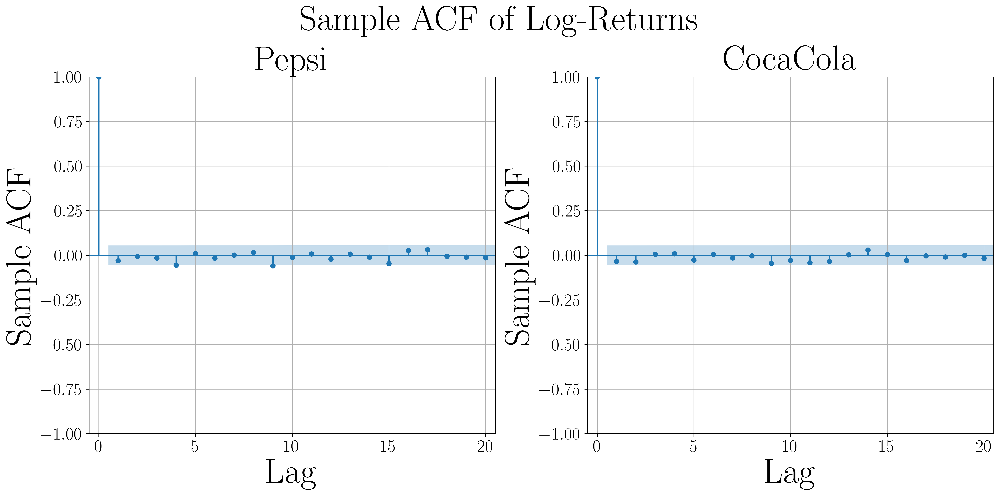

In [7]:
# Sample ACF of log returns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

plot_acf(pep_log_return, lags=20, ax=axes[0], title="Pepsi")
plot_acf(ko_log_return,  lags=20, ax=axes[1], title="CocaCola")

for ax in axes:
    ax.grid(True)
    ax.set_title(ax.get_title(), fontsize=40)
    ax.set_xlabel("Lag", fontsize=40)
    ax.set_xlim([-0.5,20.5])
    ax.set_ylabel("Sample ACF", fontsize=40)
    ax.tick_params(axis='both', labelsize=20)
    ax.grid(True)

fig.suptitle("Sample ACF of Log-Returns", fontsize=40,y=0.98)
plt.tight_layout()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Sample Autocorrelation Function of Log-Returns 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()

For both companies, the sample ACFs of the log-return series lie within the 95% confidence band at every lag up to 20, indicating no significant linear dependence between returns at different lags, a behaviour consistent with white noise. 
In particular, there does not emerge a sustained sign-alternating pattern across lags that would signal $\rho\leq -1$-type oscillatory behaviour. 
We therefore find no evidence against the restriction $\rho\in(-1,1]$ adopted in Remark 4.

We now apply the same procedure to the log-return series $r_t=\Delta X_t$ itself.
If $\{r_t\}$ decisively rejects $H_0$, this confirms that $X_t$ is integrated of order $1$ ($I(1)$), i.e. non-stationary in levels but stationary after one difference, consistent with the first-order autoregressive structure assumed in model $(1)$.  
The analogous differenced regression to $(3)$ for $r_t$ is
$$\Delta r_t = a + \gamma' r_{t-1} + \varepsilon_t,$$
where $\Delta r_t = r_t - r_{t-1}$ and $\gamma'$ plays the same role as $\gamma$ did for $X_t$. 
If $r_t$ itself followed a first-order autoregressive model with coefficient $\rho'$, then $\gamma'=\rho'-1$, and $\gamma'=0$ corresponds to $r_t$ having a unit root. As before, the augmented version includes lagged differences of $r_t$ to account for potential serial correlation:
$$\Delta r_t = a + \gamma' r_{t-1} + \sum_{i=1}^{n}\phi_i\,\Delta r_{t-i} + \varepsilon_t.$$
The hypotheses are
$$H_0:\gamma'=0\qquad(r_t\text{ has a unit root, i.e. }X_t\text{ is }I(2)\text{ or higher}),
$$
and
$$
H_1:\gamma'<0\qquad(r_t\text{ is stationary, i.e. }X_t\text{ is exactly }I(1)).
$$
We apply the same test procedure `adfuller` with `autolag='AIC'` to the log-return series, and interpret the resulting $p$-value against the same significance level $\alpha_{\text{level}}=0.05$.

In [8]:
# --- Run ADF test on log-returns ---
adf_pep = run_adf(pep_log_return, "Pepsi log-returns")
adf_ko  = run_adf(ko_log_return,  "CocaCola log-returns")



**ADF test: Pepsi log-returns**

| Test statistic | $p$-value | Lags ($n$) | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:-----:|:-----:|:------:|
| $-36.5013$ | $0.0000$ | $0$ | $-3.4356$ | $-2.8638$ | $-2.5680$ |

Reject $H_0$ at 5%: evidence against a unit root (stationary).

    



**ADF test: CocaCola log-returns**

| Test statistic | $p$-value | Lags ($n$) | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:-----:|:-----:|:------:|
| $-36.6206$ | $0.0000$ | $0$ | $-3.4356$ | $-2.8638$ | $-2.5680$ |

Reject $H_0$ at 5%: evidence against a unit root (stationary).

    

The ADF test applied to the log-return series of both companies rejects $H_0$ overwhelmingly: the $p$-values are effectively zero. 
Therefore, we have strong grounds to reject $H_0:\gamma'=0$ in favour of $H_1:\gamma'<0$ for both series.
Combining this with the earlier result on the log-price levels, both Pepsi's and CocaCola's log-price series are integrated of order $1$, i.e. $I(1)$. 
This is precisely the structure implied by model $(1)$ with $\rho$ at or very near the unit-root boundary $\rho=1$: the effect of shocks to the log-price fails to decay (non-stationary level), while the increments (namely the log-returns) are stable and fluctuate around a constant mean (stationary differences).  

**Remark 6.** *The results above justify, in retrospect, the choice made earlier to compute the volatility and correlation on the log-return series $r_t$ rather than on the log-price levels $X_t$. Since both $X_t^{\text{PEP}}$ and $X_t^{\text{KO}}$ fail to reject a unit root, they are consistent with being non-stationary. Computing correlation directly between two non-stationary series is well known to produce **spurious correlation**: two independent random walks can exhibit sample correlations close to $\pm1$ purely because both diverge from their starting values over time, with no genuine relationship between the underlying shocks. Similarly, the standard deviation (volatility) of a non-stationary series conflates long-run drift with a short-run dispersion, and is not stable or comparable across different sample windows, since $\operatorname{Var}(X_t)$ grows with $t$.*  
*By contrast, both log-return series were shown above to decisively reject the unit-root null hypothesis, carrying strong evidence of (weak) stationarity. Their mean and variance are therefore well-defined, time-invariant quantities that the corresponding sample statistics consistently estimate.*

# Cointegration

**Summary.** The Engle-Granger test finds evidence of cointegration at the 5% level ($p=0.033$), with an estimated hedge ratio $\hat\beta=1.662$.


As discussed in Remark 6, computing correlation between two non-stationary series risks producing a spurious result. Yet Pepsi and CocaCola are close competitors, and one would expect a long-term relationship between their prices, not just their day-to-day returns. 
This raises the natural question of whether there exists a way to formalise a long-run relationship between two $I(1)$ series without falling into the spurious correlation trap. 
This is precisely what **cointegration** addresses.

Correlation and cointegration are two measures that address different questions, and neither implies the other:
- **Correlation** measures the strength and direction of the contemporaneous linear association between two processes, providing a measure of comovement at the frequency and time horizon of the data;
- **Cointegration** measures whether two non-stationary series share a common long-run stochastic trend, indicating long-run comovement.

Two time series can be highly correlated in daily returns (e.g. both reacting to market-wide news) without being cointegrated (their levels could still diverge without bound over time), and conversely can be cointegrated (tightly linked in the long run) while showing weak return correlation. 
We consider the following standard notion of cointegration (see [Cointegration](https://en.wikipedia.org/wiki/Cointegration)).

**Definition 7.** 
*Let $\{X_t^{\text{PEP}}\}$ and $\{X_t^{\text{KO}}\}$ both be $I(1)$, as established above. They are said to be **cointegrated** if there exist $\alpha,\beta\in\mathbb{R}$ such that*
$$
    u_t := X_t^{\text{PEP}} - \beta X_t^{\text{KO}} -\alpha
$$
*is stationary, i.e. $I(0)$.* 

The series $\{u_t\}$ in Definition 7 is called **equilibrium error** or **spread**. 
Its stationarity implies that deviations of the two log-prices from the long-run relationship $X_t^{\text{PEP}}=\beta X_t^{\text{KO}}+\alpha$ are temporary and mean-reverting. 
This formalises the intuitive idea that competitiveness and substitution pressure prevent the two prices from drifting apart indefinitely.

## Engle–Granger Method

The classical **Engle–Granger two-step method** tests for cointegration of two $I(1)$ series as follows:
1. Estimate $\alpha$ and $\beta$ by ordinary least squares (OLS) regression of $X_t^{\text{PEP}}$ on $X_t^{\text{KO}}$.
2. Apply the ADF test to the resulting residuals $\hat u_t = X_t^{\text{PEP}} - \hat\beta X_t^{\text{KO}}-\hat\alpha$. Rejecting the unit-root null hypothesis for $\hat u_t$ provides evidence of cointegration.

Note that, since $\hat u_t$ is constructed from an estimated regression rather than observed directly, the usual Dickey–Fuller critical values are no longer valid; adjusted critical values (tabulated by Engle and Granger, and implemented in standard software) must be used instead.

In [9]:
# Step 1: OLS regression of X_pep on X_ko
X_ko_const = sm.add_constant(ko_log)          # adds intercept term alpha
ols_model  = sm.OLS(pep_log, X_ko_const).fit()

alpha_hat = ols_model.params[0]                # intercept
beta_hat  = ols_model.params[1]                # slope = beta_hat

# Step 2: ADF test on the residuals u_hat_t (adjusted critical values)
u_hat = ols_model.resid

result = adfuller(u_hat, regression='c', autolag='AIC', result_object=False)
adf_stat, pvalue, used_n, nobs, crit_values, icbest = result

# --- Step 3: Engle-Granger cointegration test (adjusted critical values)
eg_stat, eg_pvalue, eg_crit_values = coint(pep_log, ko_log)

alpha_level = 0.05
verdict = (
    f"Reject $H_0$ at {alpha_level*100:.0f}%: evidence of cointegration."
    if eg_pvalue < alpha_level else
    f"Fail to reject $H_0$ at {alpha_level*100:.0f}%: insufficient evidence of cointegration."
)

md = f"""

**OLS regression: $X_t^{{\\text{{PEP}}}}$ on $X_t^{{\\text{{KO}}}}$**

| $\\hat\\alpha$ | $\\hat\\beta$ |
|:---:|:---:|
| ${alpha_hat:.4f}$ | ${beta_hat:.4f}$ |

**ADF test on residuals $\\hat u_t$ (unadjusted DF critical values)**

| Test statistic | $p$-value | Lags ($n$) | Obs. used | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:---------:|:-----:|:-----:|:------:|
| ${adf_stat:.4f}$ | ${pvalue:.4f}$ | ${used_n}$ | ${nobs}$ | ${crit_values['1%']:.4f}$ | ${crit_values['5%']:.4f}$ | ${crit_values['10%']:.4f}$ |

**Engle-Granger cointegration test (adjusted critical values)**

| Test statistic | $p$-value | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:-----:|:-----:|:------:|
| ${eg_stat:.4f}$ | ${eg_pvalue:.4f}$ | ${eg_crit_values[0]:.4f}$ | ${eg_crit_values[1]:.4f}$ | ${eg_crit_values[2]:.4f}$ |

{verdict}

"""

display(Markdown(md))



**OLS regression: $X_t^{\text{PEP}}$ on $X_t^{\text{KO}}$**

| $\hat\alpha$ | $\hat\beta$ |
|:---:|:---:|
| $-1.4086$ | $1.6618$ |

**ADF test on residuals $\hat u_t$ (unadjusted DF critical values)**

| Test statistic | $p$-value | Lags ($n$) | Obs. used | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:----------:|:---------:|:-----:|:-----:|:------:|
| $-3.4945$ | $0.0081$ | $2$ | $1256$ | $-3.4356$ | $-2.8638$ | $-2.5680$ |

**Engle-Granger cointegration test (adjusted critical values)**

| Test statistic | $p$-value | 1% CV | 5% CV | 10% CV |
|:---------------:|:---------:|:-----:|:-----:|:------:|
| $-3.4954$ | $0.0328$ | $-3.9052$ | $-3.3410$ | $-3.0478$ |

Reject $H_0$ at 5%: evidence of cointegration.



At the 5\% level, we find evidence of cointegration between Pepsi's and CocaCola's log-price series over the 2013–2018 period. 
Both the unadjusted and adjusted tests agree on this conclusion, with the unadjusted test showing a stronger rejection, as expected given the less stringent standard Dickey–Fuller critical values. 

**Remark 8 — Interpretation of $\hat\beta$ as a hedge ratio.**  
*The coefficient $\hat\beta=1.6618$ estimated in the OLS regression admits a standard interpretation in the pairs-trading literature as a **hedge ratio**. Consider a portfolio consisting of one long unit of $X_t^{\text{PEP}}$ and $\hat\beta$ short units of $X_t^{\text{KO}}$. The (log) value of this position is*
$$
X_t^{\text{PEP}} - \hat\beta X_t^{\text{KO}},
$$
*which coincides, up to the constant $\hat\alpha$, with the estimated spread $\hat u_t$. Since $\hat\beta$ is chosen by OLS specifically to minimise the sample variance of the residual $u_t$, the portfolio is constructed so as to cancel the non-stationary trend common to both series, leaving only their company-specific (idiosyncratic) difference. Since $u_t$ has been found to be stationary at the 5\% level, this hedge-ratio-weighted position provides a basis for a pairs-trading strategy that profits from temporary deviations of the spread from its long-run mean.*

## Spread Dynamics

Having established cointegration between Pepsi's and CocaCola's log-price series over the 2013–2018 period, we now analyse the dynamics of the spread $\hat u_t = X_t^{\text{PEP}}- \hat\beta X_t^{\text{KO}} - \hat\alpha$ directly, using the same AR(1) framework introduced earlier. Fitting an AR(1) model to $\hat u_t$ lets us quantify precisely how strong and how fast the mean reversion is.

**Remark 9.** *Since $\hat u_t$ is a linear combination of the two log-price series $X_t^{\text{PEP}}$ and $X_t^{\text{KO}}$, both established to be $I(1)$ above, $\hat u_t$ is itself at most $I(1)$, and is $I(0)$ precisely in the cointegrated case. Having found $\hat u_t$ to be stationary via the Engle–Granger test above, we proceed to characterise its dynamics directly.*

We model the spread as evolving according to
$$
\hat u_t = a + \rho_u\, \hat u_{t-1} + \eta_t.
$$
The coefficient $\rho_u$ plays exactly the role $\rho$ played originally: $\rho_u$ close to $1$ indicates slow mean reversion, while $|\rho_u|$ below $1$ indicates a spread that reverts more quickly toward its long-run mean $a/(1-\rho_u)$.

We first inspect the spread series visually to confirm the absence of explosive or oscillatory behaviour, and we consider its sample autocorrelation function up to $100$ lags.

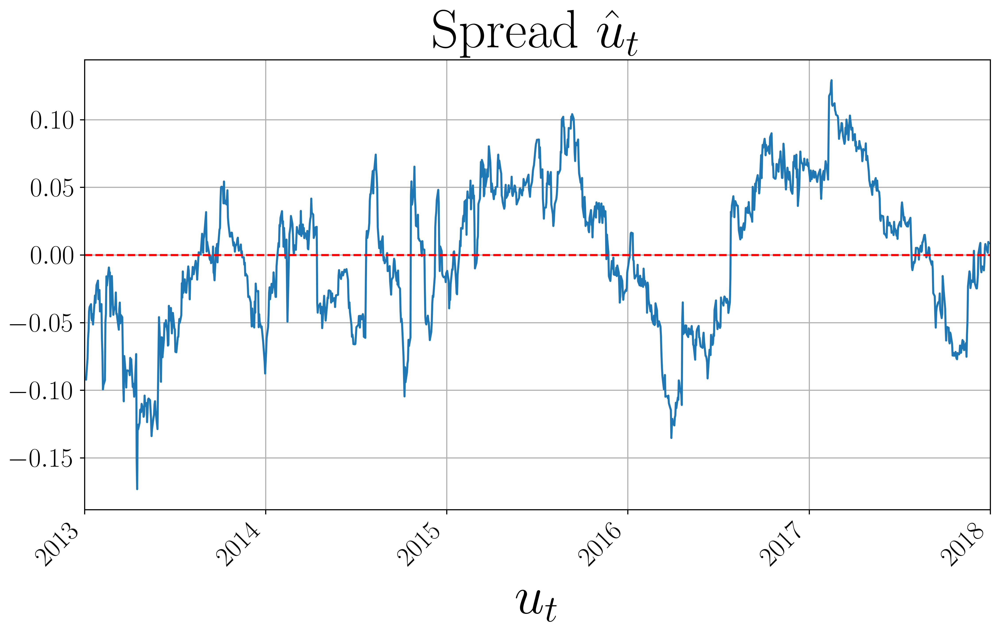

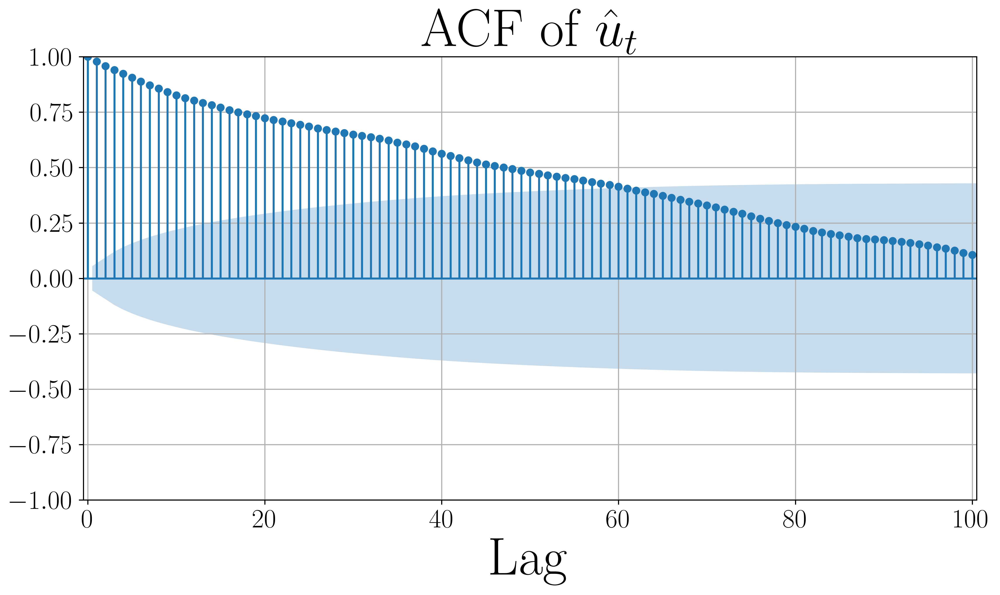

In [10]:
# Spread
plt.figure(figsize=(12,6))
plt.plot(prices.index,u_hat)
plt.axhline(u_hat.mean(), color='r', linestyle='--')
plt.title("Spread $\hat u_t$",fontsize=40,y=1.01)
plt.xlim(pd.Timestamp("2013-01-01"), pd.Timestamp("2018-01-01"))
plt.xlabel("$u_t$",fontsize=40)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Predicted Spread with Static Hedge Ratio 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()

# Spread Sample ACF
fig, ax = plt.subplots(figsize=(12,6))
plot_acf(u_hat, lags=100, ax=ax)
ax.set_xlim([-0.5,100.5])
ax.set_title("ACF of $\hat u_t$",fontsize=40)
ax.set_xlabel("Lag",fontsize=40)
ax.tick_params(axis="both", labelsize=20)
ax.grid(True)
if save_plots:
    fig.savefig("PEP-KO Pairs Trading Strategy - Plots/Autocorrelation Function of the Sample Spread 2013-2018.png", dpi=300, bbox_inches="tight")
plt.show()

The spread series $\hat u_t$ fluctuates around a long-run level close to zero.
There is no accelerating convex growth in magnitude, ruling out $\rho_u>1$. 
There is also no sign-alternating, sawtooth pattern; the series instead moves in prolonged, gradual swings, which rules out $\rho_u\leq -1$-type oscillatory behaviour.

The sample ACF confirms this: all 100 lags shown remain positive, with a smooth, gradual decay from $\approx 1$ at lag 1 to $\approx 0.12$ at lag 100, with no sign change.
The autocorrelations fall within the confidence band from around lag 60 onward, indicating that beyond this point they are no longer statistically distinguishable from zero. 
This is consistent with a persistent non-oscillatory process and, together with the level plot, justifies restricting attention to $\rho_u\in(-1,1]$, exactly as in Remark 4.

The decay of the sample ACF is informative: entering the confidence band by around lag 60 indicates a genuine reverting process, consistent with the rejection of the unit-root null found above. 
A formal AR(1) fit and explicit estimate of $\rho_u$ are carried out next to quantify this precisely.

In [11]:
# OLS Regression
u_t   = u_hat[1:]
u_lag = u_hat[:-1]

u_lag_const = sm.add_constant(u_lag)
ar1_model   = sm.OLS(u_t, u_lag_const).fit()

a_hat, rho_u_hat = ar1_model.params

m_hat        = a_hat / (1 - rho_u_hat)
kappa_hat    = 1 - rho_u_hat
half_life    = -np.log(2) / np.log(rho_u_hat)
hat_mu_u     = 1/(T+1)*sum(u_hat)                       
hat_sigma_u  = np.sqrt(1/T*sum((u_hat-hat_mu_u)**2))      # needed later

md = f"""

**AR(1) fit on the spread $\\hat u_t$**

| $\\hat a$ | $\\hat\\rho_u$ | $\\hat m$ | $\\hat\\kappa$ | Half-life (days) |
|:---:|:---:|:---:|:---:|:---:|
| ${a_hat:.6f}$ | ${rho_u_hat:.6f}$ | ${m_hat:.4f}$ | ${kappa_hat:.6f}$ | ${half_life:.2f}$ |

"""

display(Markdown(md))



**AR(1) fit on the spread $\hat u_t$**

| $\hat a$ | $\hat\rho_u$ | $\hat m$ | $\hat\kappa$ | Half-life (days) |
|:---:|:---:|:---:|:---:|:---:|
| $0.000079$ | $0.978505$ | $0.0037$ | $0.021495$ | $31.90$ |



Fitting the AR(1) model $\hat u_t = a+\rho_u\hat u_{t-1}+\eta_t$ by OLS gives
$$
\hat a = 0.000079, \qquad \hat\rho_u = 0.978505.
$$
This is consistent with the qualitative picture from the ACF above: $\hat\rho_u$ is close to, but meaningfully below, $1$, indicating a genuine but slow mean reversion in the spread.

**Equilibrium level.** 
The fitted AR(1) model implies a long-run equilibrium for the spread of
$$
\hat m = \frac{\hat a}{1-\hat\rho_u} = 0.0037,
$$
essentially zero, and consistent with the spread fluctuating around the zero line observed in the level plot above. 
This confirms that the OLS regression of $X_t^{\text{PEP}}$ on $X_t^{\text{KO}}$ (via $\hat\alpha,\hat\beta$) already captured the bulk of the long-run relationship between the two log-price series, leaving a near-zero-mean residual spread.

**Mean-Reversion Speed.** 
The estimate $\hat\rho_u=0.978505$ quantifies persistence, but is not easy to interpret directly in terms of time. 
A standard, more interpretable quantity derived from $\hat\rho_u$ is the *mean-reversion speed*, $\kappa:=1-\hat\rho_u\approx0.021495$, which measures the fraction of a deviation from equilibrium that closes in a single trading day. 
A larger $\kappa$ (closer to $1$) corresponds to fast reversion, while a smaller $\kappa$ (closer to $0$) corresponds to slow and gradual reversion.

**Mean-Reversion Half-Life.** 
The mean-reversion speed $\kappa$ expresses persistence as a per-period rate. 
The **half-life** of mean reversion re-expresses the same information as the number of periods it takes for a deviation of the spread from its long-run mean to decay, in expectation, to half its initial size.
To derive it, a recursive application of the corresponding $AR(1)$ model for $Y_0=\hat{u}_0-\hat m$ (in the absence of shocks, i.e. in expectation) as
$$
    \mathbb{E}[Y_h\mid Y_0] = \rho_u^{h}\,Y_0.
$$
The half-life $h$ is defined as the value solving
$$
\rho_u^{h} = \frac{1}{2} \quad\Longleftrightarrow\quad h = \frac{\ln(1/2)}{\ln(\rho_u)} = -\frac{\ln 2}{\ln \rho_u}.
$$
This is well-defined whenever $0<\rho_u<1$ (monotonic decay towards the mean).

A deviation of the spread $\hat u_t$ from its long-run mean is expected to decay to half its size in roughly 32 trading days. 
This is a comparatively slow tendency to revert relative to typical mean-reversion horizons in equity spreads. 
In the context of a pairs-trading interpretation as in Remark 8, a half-life of this length implies that a strategy built on this spread would need to hold positions on the order of a few weeks to have a reasonable chance of capturing the reversion.

# Optimal Trading Policy

Having characterised the spread $\hat u_t$ through its equilibrium level $\hat m$, its persistence $\hat\rho_u$, and its mean-reversion speed and half-life, the natural next step is to translate these quantities into a rule-based trading strategy. Namely, we seek a set of conditions specifying when to enter a position betting on reversion, when to exit it, and how large a position to take, using the estimated hedge ratio as a starting point. 

## Trading Model

**Summary.** 
This section only *models* the entry/exit rule, position sizing, and transaction costs. 
The thresholds $(z_{\mathrm{entry}}, z_{\mathrm{exit}})$ are optimised against 2018-2023 data in the next section, and their robustness is checked in the section
after that.

### Entry and Exit via the Standardised Spread
Rather than working with $\hat u_t$ in its raw units, we first standardise it into a **$z$-score**:
$$
    z_t := \frac{\hat u_t - \hat m}{\hat\sigma_u},
$$
where $\hat m$ is the equilibrium level estimated above, and $\hat\sigma_u$ is the sample standard deviation of the (stationary) spread series $\hat u_t$ around $\hat m$. 
The $z$-score expresses how many standard deviations the spread currently lies away from its long-run equilibrium and, being scale-free, allows entry and exit thresholds to be compared consistently across different asset pairs.  
A standard rule-based strategy is then defined by two thresholds, $z_{\text{entry}}>0$ and $0\leq z_{\text{exit}}<z_{\text{entry}}$:  
- **Entry.** When $z_t$ crosses above $z_{\text{entry}}$, the spread is unusually high, and $X_t^{\text{PEP}}$ is expensive relative to $X_t^{\text{KO}}$ given the estimated long-run relationship. The position taken is to **short the spread**: short $1$ unit of PEP, long $\hat\beta$ units of KO (recall Remark 8), betting that $\hat u_t$ reverts back down toward $\hat m$. Symmetrically, when $z_t$ crosses below $-z_{\text{entry}}$, the position is to **long the spread**: long $1$ unit of PEP, short $\hat\beta$ units of KO.
- **Exit.** The position is closed once $|z_t|$ falls back below $z_{\text{exit}}$, i.e. once the spread has reverted close enough to its equilibrium that any profit from further reversion no longer justifies holding the position (and, in practice, to avoid excessive trading around $z_{\text{exit}}=0$ exactly, which would trigger frequent re-entries from noise alone).  

Typical conventions in the literature take $z_{\text{entry}}\in[1.5,2.5]$ and $z_{\text{exit}}\in[0,0.5]$. However, the appropriate choice depends on the persistence of the spread $\hat\rho_u$ (or equivalently the half-life) and the transaction costs of trading the pair.

### Position Sizing
Given an entry signal, the *hedge ratio* $\hat\beta$ fixes the *relative* sizes of the two legs of the trade — for every $1$ unit of PEP, $\hat\beta$ units of KO are taken on the opposite side — but not the *absolute* size of the position. 
This is a separate decision, typically governed by a risk budget. 
In the following, we adopt a fixed-risk framework; therefore, the risk budget will not constitute an optimisation parameter.

Let $C_t$ denote total portfolio equity at time $t$, including realised and unrealised profits and losses, with predetermined initial capital $C_0=100{,}000\$$. 
A fixed proportion $w=0.5\%$ of portfolio equity is used as the **nominal monetary risk budget** $(wC_t)$.
The position is sized inversely to the recent volatility of the spread, so that it shrinks when the spread's recent volatility is high and grows when it is low.
Concretely, let $\hat\sigma_{\Delta z}^L$ denote the sample standard deviation of the standardised spread's daily changes, $\Delta z_t := z_t-z_{t-1}$, over the trailing $L$ days, with $L$ fixed ex-ante (using only data up to $t-1$, to avoid look-ahead).
We use the volatility of the *changes* $\Delta z_t$, not of the levels $z_t$, since it is day-to-day moves that drive P&L (namely profit/loss before adjustments) risk. 
However, setting the dollar notional exposure to 
$$
\frac{wC_t}{\hat{\sigma}_{\Delta z}^L}
$$ 
would size the position against the volatility of a standardised, unit-free quantity, ignoring the actual scale of the spread. 
To account for this, we instead set the **dollar notional exposure** to
$$
N_t = \min\left(\frac{R_t}{\hat\sigma_u\,\hat\sigma_{\Delta z}^L},\,N_{\max} C_t\right) = C_t\min\left(\frac{w}{\hat\sigma_u\,\hat\sigma_{\Delta z}^L},\,N_{\max}\right),
$$
where $N_{\max}$ is the maximum fraction of current equity that may be allocated to the position, fixed ex ante.
For a long position in the spread, the resulting share counts are, respectively,
$$
    S_t^{PEP} = \frac{N_t}{P_t^{PEP}}, \qquad S_t^{KO} = -\hat\beta\frac{N_t}{P_t^{KO}},
$$
with signs reversed for a short position.


### Transaction Costs
Any rule-based strategy built on entry/exit thresholds must account for **transaction costs**, since these directly affect which threshold choices are actually profitable and, more fundamentally, whether trading the spread is worth at all given how slowly it reverts.  
Each round-trip trade (entering and later exiting a position) incurs costs from several sources:
- **Bid-ask spread**: the difference between the price at which an asset can be bought versus sold, paid implicitly on every transaction.
- **Broker commissions/fees**: a direct, often per-share or per-trade, cost.
- **Slippage**: the difference between the expected execution price and the price actually obtained, which tends to grow with position size and market impact.
- **Financing/borrowing costs**: since the strategy involves a short leg, the short position typically incurs a borrowing fee for the duration it is held. 

A simplified standard way to incorporate these into the trading strategy is to specify a total **round-trip cost** $c$, expressed as a fraction of the traded notional (e.g. $c=0.001$ for 10 basis points), applied once when entering and once when exiting each leg of the position.  

The entry/exit thresholds $z_{\text{entry}},z_{\text{exit}}$ from above determine both the size of the expected reversion captured per trade and the *frequency* of trading. 
A narrower $(z_{\text{entry}}-z_{\text{exit}})$ band captures smaller moves but triggers more round trips, each incurring cost $c$. 
This gives a natural, minimal profitability condition: a trade should only be considered worthwhile if the expected reversion captured,
$$
\mathbb{E}[\Delta \hat u \mid \text{entry at } z_{\text{entry}},\ \text{exit at } z_{\text{exit}}] = (z_{\text{entry}}-z_{\text{exit}})\,\hat\sigma_u,
$$
exceeds the round-trip transaction cost $c$ (converted to the same units).


## Policy Optimisation

Henceforth, the 2018–2023 period shall be used for training the trading strategy. In particular, this period is used to determine optimal entry and exit conditions for the standardised spread, while keeping the statistical parameters estimated from the 2013–2018 period unchanged.

The entry and exit thresholds $z_\text{entry}$ and $z_\text{exit}$ will be treated as optimisation parameters, collected into a single **policy** $\theta:=(z_{\text{entry}},z_{\text{exit}})$. 
To this end, a predefined grid $\Theta$ of candidate policies is considered.
The optimal policy $\theta^\star$ is selected by maximising a scalar objective function $J(\theta)$ over the grid $\Theta$, namely
$$
\theta^\star\in\operatorname*{arg\,max}_{\theta\in\Theta}J(\theta).
$$
Transaction costs will be incorporated directly into the optimisation objective, rather than applied only after thresholds have been selected.
Indeed, since the round-trip cost $c$ scales with trading frequency, and the entry/exit band $(z_{\text{entry}}-z_{\text{exit}})$ directly affects such frequency, a criterion blind to $c$ could favour more active bands than one that accounts for the costs these incur. 
The selected policy is therefore cost-aware by construction.

Raw net P\&L is a poor choice for the objective function $J(\theta)$, since it may favour highly levered or infrequent lucky trades without penalising risk. 
We instead take $J$ to be the (annualised) **net Sharpe ratio** of the strategy's daily P\&L:
$$
J(\theta) \;=\; \frac{\hat\mu_{\Pi}(\theta)}{\hat\sigma_{\Pi}(\theta)}\sqrt{252},
$$
where 
$$ \Pi_t(\theta) = \frac{C_t(\theta)-C_{t-1}(\theta)}{C_{t-1}(\theta)}$$
is the daily return on capital generated by policy $\theta$ (sizing rule as above, entries/exits as specified by $\theta$), and $\hat\mu_\Pi,\hat\sigma_\Pi$ are its sample mean and standard deviation. 
Round-trip cost $c>0$ enters $J$ through $C_t(\theta)$ itself, since it is deducted from equity at every entry and exit, so that $J$ is a net-of-cost objective throughout.



**Policy Optimisation Parameters**

| Training period | Risk budget $w$ | Max. notional fraction $N_{\max}$ | Transaction cost $c$ | Volatility window $L$ | Initial capital $C_0$ | Entry threshold grid (0.05-spaced) | Exit threshold grid (0.05-spaced) |
|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
| 2018–2023 | 0.50% | 25.00% | 0.20% | 64 days | $100,000 | 1.0 – 2.5 | 0.0 – 1.5 |

**Optimal Policy**

| $z_{\mathrm{entry}}^\star$ | $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net Dollar P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|
| 2.15 | 0.50 | 0.67 | $16,941.12 | 9 |



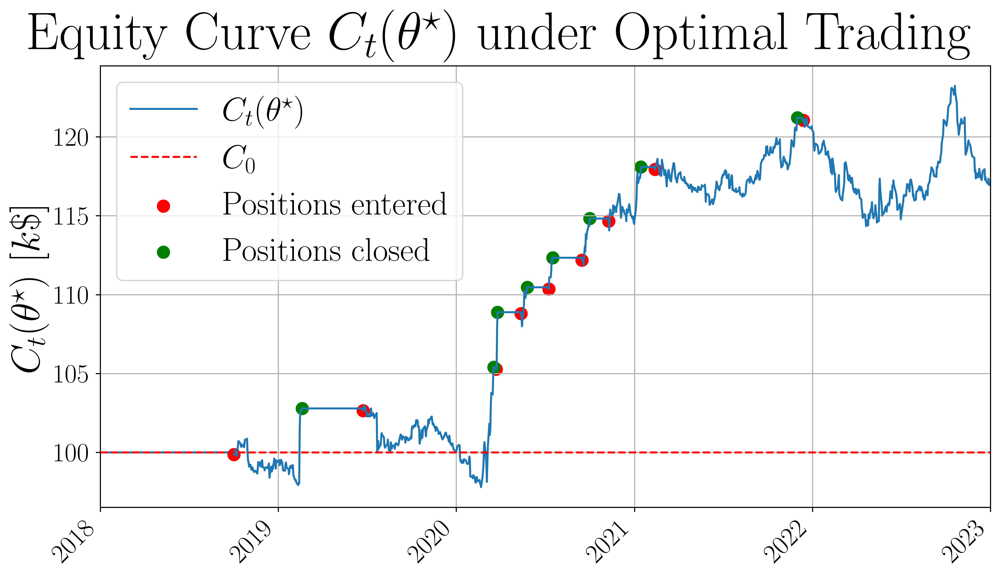

In [ ]:
def _simulate_single_policy(
    z_entry: float,
    z_exit: float,
    price_pep: np.ndarray,
    price_ko: np.ndarray,
    z: np.ndarray,
    sigma_delta_z_L: np.ndarray,
    beta_hat: float,
    sigma_u: float,
    c: float,
    w: float,
    N_max: float,
    C0: float,
    L: int,
    Trades_Timestamps: bool
):
    """
    Simulate the pairs-trading strategy for a single policy theta = (z_entry, z_exit)
    over t, given precomputed z-score z[t] and trailing volatility sigma_delta_z_L[t].

    The position sizing (dollar notional N) is computed only at entry, from the risk
    budget and volatility estimate at that time, and held fixed until exit.
    """
    T = len(z)
    C = np.empty(T)
    C[L-1] = C0

    position = 0      # 0 = flat, +1 = long the spread, -1 = short the spread
    S_pep = 0.0
    S_ko = 0.0
    N_open = 0.0      # dollar notional locked in at entry, held fixed until exit
    n_trades = 0
    if Trades_Timestamps:
        entered_positions = [[],[]]
        closed_positions = [[],[]]

    for t in range(L, T):
        C[t] = C[t - 1]

        # unrealised P&L if a position is held
        if position != 0:
            C[t] += S_pep * (price_pep[t] - price_pep[t - 1]) \
                   + S_ko * (price_ko[t] - price_ko[t - 1])

        # exit check (only if currently holding a position)
        if position != 0 and abs(z[t]) < z_exit:
            exit_cost = c * N_open * (1.0 + beta_hat)
            C[t] -= exit_cost
            position = 0
            S_pep = 0.0
            S_ko = 0.0
            N_open = 0.0
            if Trades_Timestamps:
                closed_positions[0].append(t)
                closed_positions[1].append(C[t])

        # entry check (only if no position is currently held)
        elif position == 0:
            sign = 0
            if z[t] > z_entry:
                sign = -1   # short the spread
            elif z[t] < -z_entry:
                sign = +1   # long the spread

            if sign != 0:
                sigma_hat = sigma_u * sigma_delta_z_L[t]
                if sigma_hat > 0 and np.isfinite(sigma_hat):
                    R_t = w * C[t]
                    N_t = min(R_t / sigma_hat, N_max*C[t])

                    S_pep = sign * N_t / price_pep[t]
                    S_ko = -sign * beta_hat * N_t / price_ko[t]
                    N_open = N_t
                    position = sign

                    entry_cost = c * N_open * (1.0 + beta_hat)
                    C[t] -= entry_cost

                    n_trades += 1

                    if Trades_Timestamps:
                        entered_positions[0].append(t)
                        entered_positions[1].append(C[t])

    # force liquidation at the end of the sample
    if position != 0:
        exit_cost = c * N_open * (1.0 + beta_hat)
        C[-1] -= exit_cost

        position = 0
        S_pep = 0.0
        S_ko = 0.0
        N_open = 0.0

    equity = C[L:]
    pnl = equity[-1] - equity[0]
    daily_return = np.diff(equity)/equity[:-1]

    mu_pi = daily_return.mean()
    sigma_pi = daily_return.std(ddof=1)
    J = (mu_pi / sigma_pi) * np.sqrt(252) if sigma_pi > 0 else -np.inf

    if Trades_Timestamps:
        return pnl, J, equity, n_trades, entered_positions, closed_positions
    else:
        return pnl, J, equity, n_trades


def optimize_pairs_trading_policy(
    start_date: str,
    end_date: str,
    beta_hat: float,
    alpha_hat: float,
    m_hat: float,
    sigma_u: float,
    z_entry_grid,
    z_exit_grid,
    c: float,
    w: float,
    N_max: float,
    L: int,
    C0: float,
    Timestamps = False,
    Trades_Timestamps = False
):
    """
    Optimise the pairs-trading policy theta = (z_entry, z_exit) over the grid
    Theta by maximising the annualised net Sharpe ratio J(theta).

    Parameters
    ----------
    start_date : str or pd.Timestamp 
        Start date of the simulation/training window. 
    end_date : str or pd.Timestamp 
        End date of the simulation/training window.
    beta_hat, alpha_hat, m_hat, sigma_u : float
        Cointegration/AR(1) parameters estimated on 2013-2018 and held fixed:
        u_t = X_pep,t - beta_hat*X_ko,t - alpha_hat, z_t = (u_t - m_hat)/sigma_u.
    z_entry_grid, z_exit_grid : array-like of float
        Candidate thresholds; all pairs with 0 <= z_exit < z_entry form Theta.
    c : float
        Round-trip cost, as a fraction of notional, applied once at entry and
        once at exit, on each leg of the position.
    w : float
        Risk-budget fraction, R_t = w * C_t.
    N_max : float
        Cap on the dollar notional exposure of the PEP leg.
    L : int
        Trailing window length (days) for the standardised spread's daily-change
        volatility sigma_delta_z^L.
    C0 : float, default 100_000.0
        Initial portfolio equity.
    Timestamps : bool, default False
        If True, the trading dates are returned.
    Trades_Timestamps : bool, default False
        If True, the dates when a position is entered/closed are returned.

    Returns
    -------
    theta_star : tuple (z_entry_star, z_exit_star) (optimal policy)
    J_star : float (optimal annualised net Sharpe ratio)
    pnl_star : float (optimal P&L)
    C_t(theta^star): array-like of float (optimal equity curve)
    n_trades^star: int (optimal number of trades)
    """

    # Convert dates
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)

    # Step 1. Download the data in the trading window
    data_main = yf.download(
        ["PEP", "KO"],
        start=start_date,
        end=end_date,
        auto_adjust=True,
        progress=False,
    )
    prices_main = data_main["Close"].dropna(subset=["PEP", "KO"])

    #  Step 2. Download an additional historical buffer
    #          We use a generous calendar-day buffer because L is in
    #          trading days, not calendar days.
    lookback_start = start_date - pd.Timedelta(days=3 * (L + 1))
    data_lookback = yf.download(
        ["PEP", "KO"],
        start=lookback_start,
        end=start_date,
        auto_adjust=True,
        progress=False,
    )
    prices_lookback = data_lookback["Close"].dropna(subset=["PEP", "KO"])

    # Step 3. Keep only the last L+1 actual trading observations
    prices_lookback = prices_lookback.iloc[-(L + 1):]

    # Step 4. Combine lookback + trading window
    prices = pd.concat([prices_lookback, prices_main])
    price_pep = prices["PEP"].to_numpy()
    price_ko = prices["KO"].to_numpy()

    # Step 5. Spread and standardised spread, over the full series (incl. lookback)
    X_pep = np.log(price_pep)
    X_ko = np.log(price_ko)
    u = X_pep - beta_hat * X_ko - alpha_hat
    z = (u - m_hat) / sigma_u

    # Step 6. Recent volatility of z's daily changes, using only data up to t-1
    delta_z = pd.Series(z).diff()
    sigma_delta_z_L = delta_z.rolling(window=L).std(ddof=1).shift(1).to_numpy()

    # Step 7. Grid search over Theta
    best_J = -np.inf

    for z_entry, z_exit in itertools.product(z_entry_grid, z_exit_grid):
        if not (z_entry > 0 and 0 <= z_exit < z_entry):
            continue

        if Trades_Timestamps:
            pnl, J, equity, n_trades, entered_positions, closed_positions = _simulate_single_policy(
                z_entry=z_entry, 
                z_exit=z_exit,
                price_pep=price_pep, 
                price_ko=price_ko,
                z=z, 
                sigma_delta_z_L=sigma_delta_z_L,
                beta_hat=beta_hat, 
                sigma_u=sigma_u,
                c=c, 
                w=w, 
                N_max=N_max, 
                C0=C0, 
                L=L,
                Trades_Timestamps=Trades_Timestamps,
            )
        else:
            pnl, J, equity, n_trades = _simulate_single_policy(
                z_entry=z_entry, 
                z_exit=z_exit,
                price_pep=price_pep, 
                price_ko=price_ko,
                z=z, 
                sigma_delta_z_L=sigma_delta_z_L,
                beta_hat=beta_hat, 
                sigma_u=sigma_u,
                c=c, 
                w=w, 
                N_max=N_max, 
                C0=C0, 
                L=L,
                Trades_Timestamps=Trades_Timestamps,
            )

        if J > best_J:
            best_theta, best_J, best_pnl, best_equity, best_n_trades = (z_entry, z_exit), J, pnl, equity, n_trades
            if Trades_Timestamps:
                best_entered_positions, best_closed_positions = entered_positions,closed_positions

    if Trades_Timestamps:
        best_entered_positions[0] = [prices.index[i] for i in best_entered_positions[0]]
        best_closed_positions[0] = [prices.index[i] for i in best_closed_positions[0]]

    if Timestamps and Trades_Timestamps:
        return best_theta, best_J, best_pnl, best_equity, best_n_trades, prices.index[L:], best_entered_positions, best_closed_positions
    elif Timestamps:
        return best_theta, best_J, best_pnl, best_equity, best_n_trades, prices.index[L:]
    elif Trades_Timestamps:
        return best_theta, best_J, best_pnl, best_equity, best_n_trades, best_entered_positions, best_closed_positions
    else:
        return best_theta, best_J, best_pnl, best_equity, best_n_trades
    
# parameter setting and opitmisation
start_date = "2018.01.01"
end_date = "2023.01.01"
z_entry_grid =  np.arange(1,2.505,0.05)   # candidate entry thresholds
z_exit_grid = np.arange(0,1.505,0.05)     # candidate exit thresholds
c = 0.002 
w = 0.005
N_max = 0.25
L = int(np.ceil(2*half_life))
C0 = 100000


# Run Optimisation
theta, J, pnl, equity, n_trades,timestamps, entered_positions, closed_positions = optimize_pairs_trading_policy(
    start_date=start_date,
    end_date=end_date,
    beta_hat=beta_hat,
    alpha_hat=alpha_hat,
    m_hat=m_hat,
    sigma_u=hat_sigma_u,
    z_entry_grid=z_entry_grid,
    z_exit_grid=z_exit_grid,
    c=c,
    w=w,
    N_max=N_max,
    L=L,
    C0 = C0,
    Timestamps=True,
    Trades_Timestamps=True,
)


# Display Results
md = f"""

**Policy Optimisation Parameters**

| Training period | Risk budget $w$ | Max. notional fraction $N_{{\\max}}$ | Transaction cost $c$ | Volatility window $L$ | Initial capital $C_0$ | Entry threshold grid (0.05-spaced) | Exit threshold grid (0.05-spaced) |
|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
| 2018–2023 | {w:.2%} | {N_max:.2%} | {c:.2%} | {L} days | ${C0:,.0f} | {z_entry_grid.min():.1f} – {z_entry_grid.max():.1f} | {z_exit_grid.min():.1f} – {z_exit_grid.max():.1f} |

**Optimal Policy**

| $z_{{\\mathrm{{entry}}}}^\\star$ | $z_{{\\mathrm{{exit}}}}^\\star$ | Annualised Sharpe $J^\\star$ | Net Dollar P&L | $n_{{\\text{{trades}}}}$ |
|:---:|:---:|:---:|:---:|:---:|
| {theta[0]:.2f} | {theta[1]:.2f} | {J:.2f} | ${pnl:,.2f} | {n_trades} |

"""

display(Markdown(md))

plt.figure(figsize=(12,6))
plt.plot(timestamps,equity/1000,label="$C_t(\\theta^\star)$")
plt.axhline(y=C0/1000,label="$C_0$",color="red",linestyle="--")
plt.scatter(entered_positions[0],[x/1000 for x in entered_positions[1]],s=80,color="red",label="Positions entered")
plt.scatter(closed_positions[0],[x/1000 for x in closed_positions[1]],s=80,color="green",label="Positions closed")
plt.ylabel("$C_t(\\theta^\star)\ [k\$]$", fontsize=30)
plt.title("Equity Curve $C_t(\\theta^\star)$ under Optimal Trading", fontsize=40,y=1.02,x=0.45)
plt.xlim([pd.Timestamp("2018.01.01"),pd.Timestamp("2023.01.01")])
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.legend(fontsize=25)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Equity Curve with Optimal Policy and Baseline Parameters 2018-2023.png", dpi=300, bbox_inches="tight")
plt.show()


The policy parameters are fixed ex ante, with a $0.5\%$ risk budget $w$, a $25\%$ maximum notional exposure $N_{\max}$, a $0.20\%$ transaction cost $c$, and a $64$-day volatility window $L$ (approximately twice the mean-reversion half-life). 
The entry and exit thresholds are optimised over the specified grids.  
The in-sample optimisation over 2018-2023 selects
$$
\theta^\star=(z_{\mathrm{entry}}^\star,z_{\mathrm{exit}}^\star)=(2.15,0.50).
$$
This policy generates 9 trades over the training period, achieving an annualised Sharpe ratio of $0.67$ and a net P\&L of $\$16{,}941.20$.

These results are in-sample and therefore provide only an initial assessment of the strategy. 
The next sections examine the sensitivity of the results to the modelling choices and evaluate the selected policy using walk-forward validation.

# Robustness Analysis

We assess the robustness of the proposed approach by repeating the policy optimisation under alternative values of the key modelling parameters $c$, $w$, $L$, and $N_{\max}$. 
Starting from the parameter values used in the baseline optimisation, each parameter is varied individually while keeping the remaining parameters fixed at their baseline values. 
This one-at-a-time sensitivity analysis allows us to examine the extent to which the optimisation results depend on the specific choice of each parameter.

**Summary.** The in-sample optimum $\theta^\star=(2.15,0.50)$ recurs across most of the parameter grid below; it only shifts toward more frequent trading at the extremes (very low costs/risk budgets, very high exposure caps).

## Parameter Sensitivity

### Cost Parameter $c$

In [13]:
cp_grid = [0.0001, 0.0005, 0.001, 0.002, 0.005, 0.0075, 0.01]

results = []

for cp in cp_grid:

    theta, J, pnl, equity, n_trades = optimize_pairs_trading_policy(
        start_date=start_date,
        end_date=end_date,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=cp,
        w=w,
        N_max=N_max,
        L=L,
        C0=C0
    )

    results.append({
        "c": cp,
        "z_entry": theta[0],
        "z_exit": theta[1],
        "sharpe": J,
        "pnl": pnl,
        "n_trades": n_trades,
        "equity": equity
    })


# Results table

md = """
**Transaction Cost Sensitivity**

| Transaction cost $c$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""

for r in results:
    md += (
        f"| {r['c']:.2%} "
        f"| {r['z_entry']:.2f} "
        f"| {r['z_exit']:.2f} "
        f"| {r['sharpe']:.2f} "
        f"| ${r['pnl']:,.2f} "
        f"| {r['n_trades']} |\n"
    )

display(Markdown(md))


**Transaction Cost Sensitivity**

| Transaction cost $c$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 0.01% | 1.30 | 0.65 | 0.77 | $21,923.46 | 20 |
| 0.05% | 2.15 | 0.50 | 0.74 | $18,866.65 | 9 |
| 0.10% | 2.15 | 0.50 | 0.72 | $18,221.70 | 9 |
| 0.20% | 2.15 | 0.50 | 0.67 | $16,941.12 | 9 |
| 0.50% | 2.15 | 0.50 | 0.54 | $13,172.85 | 9 |
| 0.75% | 2.35 | 0.50 | 0.43 | $10,149.35 | 8 |
| 1.00% | 2.35 | 0.50 | 0.32 | $7,452.06 | 8 |


For transaction costs between $5$ bps and $50$ bps, the optimal policy is $(2.15,0.50)$ with $9$ trades. At the lowest transaction cost of $0.01\%$, the optimal policy $(1.30,0.65)$ is comparatively more active with $20$ trades. Conversely, at higher costs of $0.75\%$ and $1.00\%$, the optimiser becomes more selective, increasing the entry threshold to $2.35$ and reducing the number of trades to $8$. Within the range, the Sharpe declines meaningfully from $0.77$ at $c=1$ bp to $0.32$ at $100$ bps. Overall, the transaction-cost sensitivity analysis shows that the optimisation behaves consistently with the economic role of trading costs.

### Risk Budget

In [14]:
w_grid = [0.001,0.002,0.005,0.01]
results = []
for wg in w_grid:

    theta, J, pnl, equity, n_trades = optimize_pairs_trading_policy(
        start_date=start_date,
        end_date=end_date,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c,
        w=wg,
        N_max=N_max,
        L=L,
        C0=C0
    )

    results.append({
        "w": wg,
        "z_entry": theta[0],
        "z_exit": theta[1],
        "sharpe": J,
        "pnl": pnl,
        "n_trades": n_trades,
        "equity": equity
    })


# Results table

md = """
**Risk Budget Sensitivity**

| Risk Budget Factor $w$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""

for r in results:
    md += (
        f"| {r['w']:.2%} "
        f"| {r['z_entry']:.2f} "
        f"| {r['z_exit']:.2f} "
        f"| {r['sharpe']:.2f} "
        f"| ${r['pnl']:,.2f} "
        f"| {r['n_trades']} |\n"
    )

display(Markdown(md))


**Risk Budget Sensitivity**

| Risk Budget Factor $w$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 0.10% | 1.30 | 0.45 | 0.55 | $3,884.57 | 15 |
| 0.20% | 1.30 | 0.45 | 0.55 | $7,890.99 | 15 |
| 0.50% | 2.15 | 0.50 | 0.67 | $16,941.12 | 9 |
| 1.00% | 2.15 | 0.50 | 0.72 | $18,828.45 | 9 |


At $w=0.10\%$ and $0.20\%$, the optimiser selects lower entry thresholds of $(1.30,0.45)$ and executes $15$ trades, while increasing $w$ substantially increases net P\&L. At $w=0.50\%$ and $1.0\%$, the optimal policy changes to $(z_{\mathrm{entry}}^\star,z_{\mathrm{exit}}^\star)=(2.15,0.50)$, accompanied by a reduction in the number of trades from 15 to 9 and an increase in the annualised Sharpe ratio.

### Volatility Window

In [15]:
L_grid = [int(np.round(i*2*half_life)) for i in [0.05,0.1,2,5,7.5]]

results = []

for Lg in L_grid:

    theta, J, pnl, equity, n_trades = optimize_pairs_trading_policy(
        start_date=start_date,
        end_date=end_date,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c,
        w=w,
        N_max=N_max,
        L=Lg,
        C0=C0
    )

    results.append({
        "L": Lg,
        "z_entry": theta[0],
        "z_exit": theta[1],
        "sharpe": J,
        "pnl": pnl,
        "n_trades": n_trades,
        "equity": equity
    })


# Results table

md = """
**Volatility Window Sensitivity**

| Volatility Window $L$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""

for r in results:
    md += (
        f"| {r['L']} days "
        f"| {r['z_entry']:.2f} "
        f"| {r['z_exit']:.2f} "
        f"| {r['sharpe']:.2f} "
        f"| ${r['pnl']:,.2f} "
        f"| {r['n_trades']} |\n"
    )

display(Markdown(md))


**Volatility Window Sensitivity**

| Volatility Window $L$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 3 days | 2.35 | 0.50 | 0.67 | $16,368.20 | 8 |
| 6 days | 2.15 | 0.50 | 0.68 | $17,240.58 | 9 |
| 128 days | 2.15 | 0.50 | 0.67 | $16,966.81 | 9 |
| 319 days | 2.15 | 0.50 | 0.72 | $18,478.38 | 9 |
| 478 days | 2.15 | 0.50 | 0.72 | $18,828.45 | 9 |


For volatility windows of $6$ days or longer, the optimiser consistently selects an entry threshold of $2.15$ and an exit threshold of $0.50$, with $9$ trades. For the shortest window of $3$ days, the entry threshold increases to $2.35$ and the number of trades decreases to $8$. The annualised Sharpe ratio and net P\&L remain relatively stable across these windows. Overall, the results show limited sensitivity to the choice of volatility window.

### Maximum Equity Exposure

In [16]:
N_max_grid = [0.05,0.1,0.25,0.5,1]

results = []

for Ng in N_max_grid:

    theta, J, pnl, equity, n_trades = optimize_pairs_trading_policy(
        start_date=start_date,
        end_date=end_date,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c,
        w=w,
        N_max=Ng,
        L=L,
        C0=C0
    )

    results.append({
        "N_max": Ng,
        "z_entry": theta[0],
        "z_exit": theta[1],
        "sharpe": J,
        "pnl": pnl,
        "n_trades": n_trades,
        "equity": equity
    })


# Results table

md = """
**Maximum Equity Exposure Sensitivity**

| Maximum Equity Exposure $N_{{\max}}$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""

for r in results:
    md += (
        f"| {r['N_max']:.2%} "
        f"| {r['z_entry']:.2f} "
        f"| {r['z_exit']:.2f} "
        f"| {r['sharpe']:.2f} "
        f"| ${r['pnl']:,.2f} "
        f"| {r['n_trades']} |\n"
    )

display(Markdown(md))



**Maximum Equity Exposure Sensitivity**

| Maximum Equity Exposure $N_{{\max}}$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 5.00% | 2.15 | 0.50 | 0.72 | $3,567.35 | 9 |
| 10.00% | 2.15 | 0.50 | 0.72 | $7,232.29 | 9 |
| 25.00% | 2.15 | 0.50 | 0.67 | $16,941.12 | 9 |
| 50.00% | 1.30 | 0.45 | 0.55 | $19,783.14 | 15 |
| 100.00% | 1.30 | 0.45 | 0.56 | $20,667.02 | 15 |


For maximum equity exposures between $5\%$ and $25\%$, the optimiser selects $(z_{\mathrm{entry}}^\star,z_{\mathrm{exit}}^\star)=(2.15,0.50)$ with $9$ trades. At $N_{\max}=50\%$, the optimal policy changes to $(1.30,0.45)$, resulting in more frequent trading and a further increase in net P\&L. Increasing the maximum exposure to $100\%$ produces little additional change, suggesting that the strategy becomes less sensitive to the exposure cap once it is sufficiently high. 

### Summary 

Overall, the results indicate that the exposure constraint affects the optimal trading policy, with higher exposure allowing a more active strategy but not necessarily improving risk-adjusted performance.

## Walk-Forward Validation

Optimising $\theta^\star$ and evaluating it on the same 2018–2023 data used to select it could overstate its performance, since $\theta^\star$ is fit to that data's noise as well as its signal.
To obtain a further look-ahead-free check of whether this optimisation procedure is robust to noise, we employ a **walk-forward** validation.  

The 2018–2023 sample is divided into $3$ folds of consecutive training $\mathcal T_k$ and testing $\mathcal S_k$ windows:
$$
\begin{array}{cc}
\mathcal T_1=[2018,2020), & \mathcal S_1=[2020,2021); \\
\mathcal T_2=[2019,2021), & \mathcal S_2=[2021,2022); \\
\mathcal T_3=[2020,2022), & \mathcal S_3=[2022,2023).
\end{array}
$$
All other model and portfolio parameters are kept fixed at their baseline values throughout the walk-forward procedure, with only the policy parameters $\theta=(z_{\mathrm{entry}},z_{\mathrm{exit}})$ re-optimised within each training window.
Specifically, for each fold $k=1,2,3$, we determine the optimal policy using training-window data only,
$$
\theta_k^\star = \operatorname*{arg\,max}_{\theta\in\Theta}J_{\mathcal{T}_k}(\theta),
$$
then fix $\theta_k^\star$ and apply it, without modification, to the subsequent testing window $\mathcal{S}_k$. 
This produces an out-of-sample (OOS) return series for each fold without using future information in the policy-selection step.  
The three out-of-sample return series are then concatenated to form a single OOS track record, from which we compute the overall annualised Sharpe ratio:
$$
J^{\mathrm{oos}} = J\left( R_{\mathcal{S}_1}(\theta_1^\star) \oplus R_{\mathcal{S}_2}(\theta_2^\star) \oplus R_{\mathcal{S}_3}(\theta_3^\star) s\right),
$$
where $\oplus$ indicates concatenation.
In addition to aggregate out-of-sample performance, we inspect the sequence
$\{\theta_k^\star\}_{k=1}^3$. Substantial variation in the optimal thresholds across folds may indicate that the selected policy is sensitive to the particular training period, providing additional information about the stability of the optimisation procedure.


**Walk-Forward Validation**

| Fold $k$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J_{\mathcal{S}_k}^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 1 | 1.30 | 0.65 | 2.143 | \$13793.71 | 12 |
| 2 | 2.15 | 0.35 | -0.073 | \$-391.21 | 1 |
| 3 | 2.00 | 0.50 | -0.501 | \$-2795.70 | 1 |



**Aggregate OOS annualised Sharpe ratio**: $J^{OOS}$ = 0.64


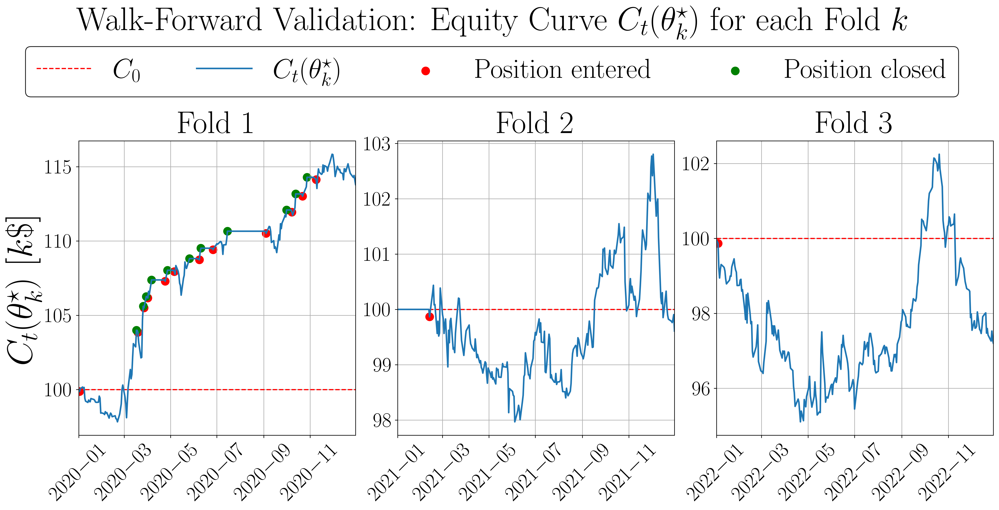

In [ ]:
# Initialise display of results
oos_returns = []
fig, ax = plt.subplots(1,3, figsize=(18, 8), sharey=False)
md = """
**Walk-Forward Validation**

| Fold $k$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J_{\\mathcal{S}_k}^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""

# Walk-Forward procedure
for i in range(3):
    # Step 1. Optimise over the training window T_k
    theta, _, _, _, _ = optimize_pairs_trading_policy(
        start_date=str(2018+i)+".01.01",
        end_date=str(2020+i)+".01.01",
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c,
        w=w,
        N_max=N_max,
        L=L,
        C0=C0
    )

    # Step 2. OOS performance on the testing window S_k
    _, J, pnl, equity, n_trades, timestamps, entered_positions, closed_positions = optimize_pairs_trading_policy(
            start_date=str(2020+i)+".01.01",
            end_date=str(2021+i)+".01.01",
            beta_hat=beta_hat,
            alpha_hat=alpha_hat,
            m_hat=m_hat,
            sigma_u=hat_sigma_u,
            z_entry_grid=[theta[0]],
            z_exit_grid=[theta[1]],
            c=c,
            w=w,
            N_max=N_max,
            L=L,
            C0=C0,
            Timestamps=True,
            Trades_Timestamps=True,
        )

    # Step 3. Display Results
    md += (
        f"| {i+1} "
        f"| {theta[0]:.2f} "
        f"| {theta[1]:.2f} "
        f"| {J:.3f} "
        f"| \${pnl:.2f} "
        f"| {n_trades} |\n"
    )

    # Step 4. Prepare for J^OOS computation
    equity = np.asarray(equity, dtype=float)
    returns = equity[1:] / equity[:-1] - 1
    oos_returns.extend(returns)

    # Step 5. Prepare for plotting
    ax[i].axhline(y=C0/1000, color="red", linestyle="--",label="$C_0$")
    ax[i].plot(timestamps,equity/1000,linewidth=2,label="$C_t(\\theta^\star_k)$")
    if entered_positions[0]:
        ax[i].scatter(entered_positions[0],[x/1000 for x in entered_positions[1]],color="red",s=100,label="Position entered")
    if closed_positions[0]:
        ax[i].scatter(closed_positions[0],[x/1000 for x in closed_positions[1]],color="green",s=100,label="Position closed")
    ax[i].set_xlim([pd.Timestamp(str(2020+i)+".01.01"),timestamps[-1]])
    ax[i].set_title(f"Fold ${i+1}$",fontsize=40,y=1.01)
    ax[i].tick_params(axis="x", labelsize=26,rotation=45)
    ax[i].xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    ax[i].tick_params(axis="y", labelsize=26,rotation=0)
    ax[i].grid(True)


# Display results per fold
display(Markdown(md))


# Display J^OOS
oos_returns = np.asarray(oos_returns)
J_oos = np.sqrt(252) * np.mean(oos_returns) / np.std(oos_returns, ddof=1)
md = f"""
**Aggregate OOS annualised Sharpe ratio**: $J^{{OOS}}$ = {J_oos:.2f}
"""
display(Markdown(md))


# Display Equity Curves
ax[0].set_ylabel("$C_t(\\theta^\star_k)\ [k\$]$",fontsize=45)
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.06),
    ncol=len(labels),
    fontsize=35,
    frameon=True,
    fancybox=True,
    framealpha=0.9,
    edgecolor="black",
    facecolor="white",
)
plt.suptitle("Walk-Forward Validation: Equity Curve $C_t(\\theta^\star_k)$ for each Fold $k$",fontsize=42,y=1.12)
plt.tight_layout()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Equity Curve with Optimal Policy for each Walk-Forward Validation Fold 2018-2023.png", dpi=300, bbox_inches="tight")
plt.show()

The walk-forward results indicate that the strategy's out-of-sample performance is heterogeneous across the three testing periods. The first fold produces strong performance, with an annualised Sharpe ratio of $2.14$ and $12$ trades. In contrast, the second and third folds generate negative Sharpe ratios of $-0.07$ and $-0.50$, respectively, with only one trade in each period: this suggests interpreting the Sharpe ratios with caution. The aggregate OOS annualised Sharpe ratio is $0.64$, indicating positive performance across the combined testing periods. Overall, the walk-forward results suggest that the strategy's performance is sensitive to the market period and does not generalise uniformly across all out-of-sample windows.

## Caveat: COVID-19 Market Dislocation

The strong asymmetry across walk-forward folds is worth closer scrutiny.
Examining the equity plot of the optimal trading policy with baseline parameters over the entire 2018-2023 window, it can be seen that the majority of the in-sample net P&L is generated over a short trading window in 2020, which corresponds to the COVID-19 market dislocation of February–April 2020.
This event caused extreme volatility spikes followed by rapid recovery, which is exactly the kind of large, fast mean-reverting event that this strategy is designed to exploit.

This raises a concern about regime dependence.
Indeed, the performance of the selected strategy may strongly reflect a single macro volatility event rather than a persistent relationship between PEP and KO. 
If this is the case, the reported Sharpe ratios may overstate expected performance in more typical market conditions, and the scarcity of trades outside this window confirms this. 

### COVID-Window Exclusion

To assess whether the strategy has an edge independent of this event, we repeat the analysis excluding the COVID-19 period from both estimation and evaluation, and check whether performance and trade frequency remain stable without it. 
However, simply disregarding the corresponding rows from the price series and treating the remainder as one continuous series would introduce two problems:

1. **A fictitious jump return.** The simulation computes daily returns at adjacent array positions. If the trading days corresponding to the COVID-19 dislocation are simply deleted, the day immediately preceding the gap and the day immediately following it become adjacent in the array, even though several weeks separate them in calendar time. The resulting "overnight" price change would therefore be treated as a single (likely large and spurious) daily return. 

2. **Contaminated rolling estimates.** The $L$-day rolling volatility $\hat\sigma_{\Delta z}^L$ is computed via a rolling window over consecutive array entries. Concatenating pre- and post-COVID prices would cause this window to contaminate observations from before and after the gap as if they were adjacent trading days, distorting the position-sizing volatility estimate right at the start of the post-COVID segment.

To circumvent these potential issues, we treat the pre-COVID and post-COVID windows as two independent contiguous segments. 
Each is estimated and simulated separately, with its own lookback buffer for the rolling volatility window, its own reset of portfolio equity to $C_0$, and any open position force-liquidated at the end of the segment. 
The two daily return-on-capital series $\Pi_t$ are only concatenated after simulation, so as to allow the computation of the annualised Sharpe ratio, mirroring the approach already used to aggregate the walk-forward folds.
We also include an annualised Sharpe ratio surface, namely a table that reports the Sharpe ratio for each admissible entry/exit pair in the search grid $\Theta$.


**Optimal Policy (COVID-19 window excluded)**

| $z_{\mathrm{entry}}^\star$ | $z_{\mathrm{exit}}^\star$ | Optimal Aggregate Annualised Sharpe | Optimal Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|
| 2.15 | 0.50 | 0.28 | $5,759.68 | 8 |


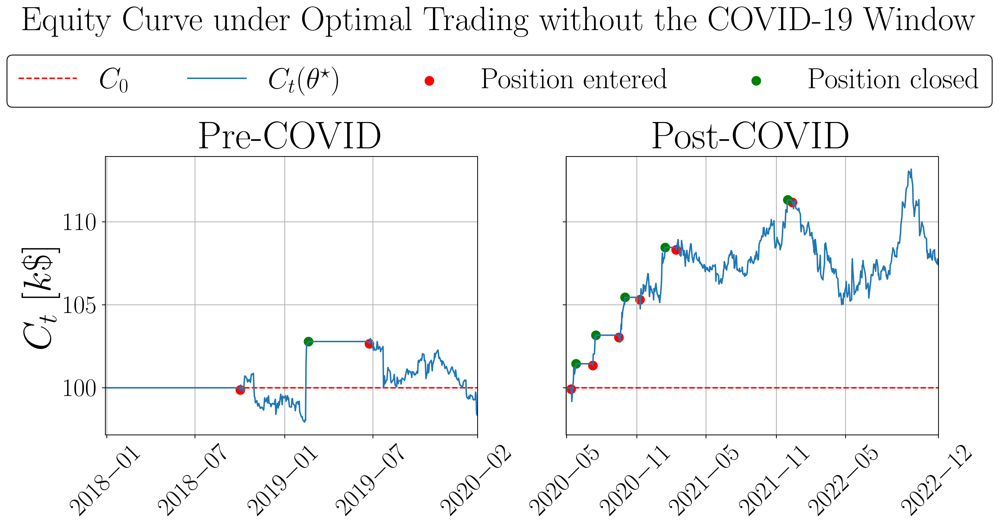

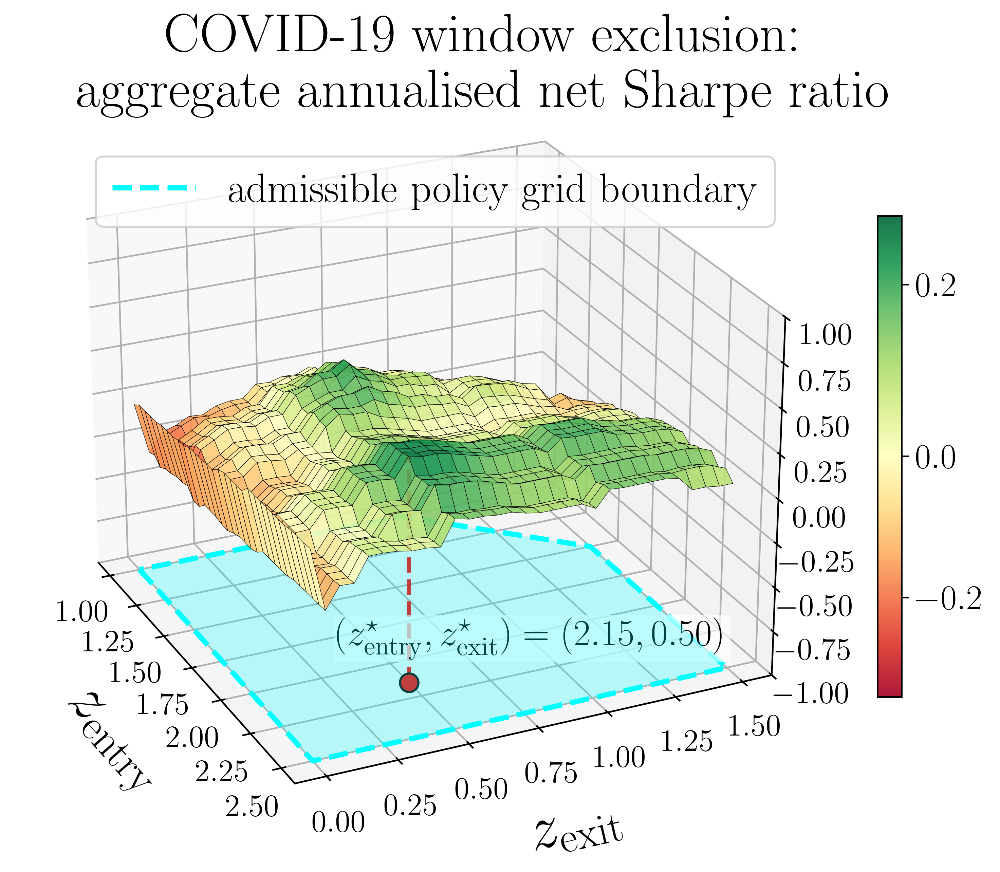

In [ ]:
# The logic is the same as for the full period, but the individual segments need to be
# manipulated so that the capital is always initialised to C_0 and each segment contains
# its own (independent) buffer for the volatility window. Only after simulation of a policy
# are the daily returns on capital concatenated into a single series for the computation
# of the aggregate annualised net Sharpe ratio.

def _prepare_segment(start_date, end_date, beta_hat, alpha_hat, m_hat, sigma_u, L):
    """
    Download and prepare one contiguous segment: standardised spread z_t and
    its rolling L-day volatility of daily changes, using an own lookback buffer
    so estimates at the start of the segment don't depend on any other segment.
    """
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)

    data_main = yf.download(
        ["PEP", "KO"], start=start_date, end=end_date,
        auto_adjust=True, progress=False,
    )
    prices_main = data_main["Close"].dropna(subset=["PEP", "KO"])

    # Look-back with generous buffer
    lookback_start = start_date - pd.Timedelta(days=3 * (L + 1))
    data_lookback = yf.download(
        ["PEP", "KO"], start=lookback_start, end=start_date,
        auto_adjust=True, progress=False,
    )
    prices_lookback = data_lookback["Close"].dropna(subset=["PEP", "KO"])
    prices_lookback = prices_lookback.iloc[-(L + 1):]

    # segment series (incl. buffer for the volatility window)
    prices = pd.concat([prices_lookback, prices_main])
    price_pep = prices["PEP"].to_numpy()
    price_ko = prices["KO"].to_numpy()

    X_pep = np.log(price_pep)
    X_ko = np.log(price_ko)
    u = X_pep - beta_hat * X_ko - alpha_hat
    z = (u - m_hat) / sigma_u

    delta_z = pd.Series(z).diff()
    sigma_delta_z_L = delta_z.rolling(window=L).std(ddof=1).shift(1).to_numpy()

    return {
        "price_pep": price_pep,
        "price_ko": price_ko,
        "z": z,
        "sigma_delta_z_L": sigma_delta_z_L,
        "index": prices.index,   
        "burn_in": L,            
    }


def _simulate_single_policy_multi(
    z_entry: float,
    z_exit: float,
    segments: list,
    beta_hat: float,
    sigma_u: float,
    c: float,
    w: float,
    N_max: float,
    C0: float,
    Timestamps: bool = False,
    Trades_Timestamps: bool = False,
):
    """
    Simulate a policy across one or more INDEPENDENT segments (e.g. pre-COVID 
    and post-COVID sub-periods). Each segment resets equity to C0 and is simulated 
    independently; daily return-on-capital series are concatenated only after
    simulation to compute the aggregate annualised Sharpe ratio, so no return
    is ever computed across the excluded gap between segments.
    """
    all_daily_returns = []
    total_trades = 0
    total_pnl = 0.0
    equities = []
    if Timestamps:
        timestamps = []
    if Trades_Timestamps:
        entered_positions = []
        closed_positions = []

    for seg in segments:
        if Trades_Timestamps:
            pnl, _, equity, n_trades, seg_entered, seg_closed = _simulate_single_policy(
                z_entry=z_entry, 
                z_exit=z_exit,
                price_pep=seg["price_pep"], 
                price_ko=seg["price_ko"],
                z=seg["z"], 
                sigma_delta_z_L=seg["sigma_delta_z_L"],
                beta_hat=beta_hat, 
                sigma_u=sigma_u,
                c=c,
                w=w, 
                N_max=N_max, 
                C0=C0,
                L=seg["burn_in"], 
                Trades_Timestamps=True,
            )
            entered_positions.append([
                [seg["index"][i] for i in seg_entered[0]], seg_entered[1]
            ])
            closed_positions.append([
                [seg["index"][i] for i in seg_closed[0]], seg_closed[1]
            ])
        else:
            pnl, _, equity, n_trades = _simulate_single_policy(
                z_entry=z_entry, 
                z_exit=z_exit,
                price_pep=seg["price_pep"], 
                price_ko=seg["price_ko"],
                z=seg["z"], 
                sigma_delta_z_L=seg["sigma_delta_z_L"],
                beta_hat=beta_hat, 
                sigma_u=sigma_u,
                c=c, 
                w=w, 
                N_max=N_max, 
                C0=C0,
                L=seg["burn_in"], 
                Trades_Timestamps=False,
            )

        all_daily_returns.append(np.diff(equity) / equity[:-1])
        total_trades += n_trades
        total_pnl += pnl
        equities.append(equity)
        if Timestamps:
            timestamps.append(seg["index"][seg["burn_in"]:])

    daily_returns = np.concatenate(all_daily_returns)
    mu_pi = daily_returns.mean()
    sigma_pi = daily_returns.std(ddof=1)
    J = (mu_pi / sigma_pi) * np.sqrt(252) if sigma_pi > 0 else -np.inf

    out = (total_pnl, J, equities, total_trades)
    if Timestamps and Trades_Timestamps:
        return out + (timestamps, entered_positions, closed_positions)
    elif Timestamps:
        return out + (timestamps,)
    elif Trades_Timestamps:
        return out + (entered_positions, closed_positions)
    else:
        return out


def optimize_pairs_trading_policy_segments(
    periods: list,   # list of (start_date, end_date) tuples; one per contiguous segment
    beta_hat: float,
    alpha_hat: float,
    m_hat: float,
    sigma_u: float,
    z_entry_grid,
    z_exit_grid,
    c: float,
    w: float,
    N_max: float,
    L: int,
    C0: float,
    Timestamps: bool = False,
    Trades_Timestamps: bool = False,
    return_surface: bool = False,
):
    """
    Optimise theta = (z_entry, z_exit) by maximising the annualised net Sharpe
    ratio of daily returns, aggregated across one or more independent periods. 
    Pass a single (start_date, end_date) tuple to reproduce the original full-
    period behaviour, or multiple non-adjacent tuples (e.g. pre-COVID and post-
    COVID windows) to exclude a gap.

    Timestamps : bool, default False
        If True, per-segment trading dates are returned (list of DatetimeIndex,
        one per segment).
    Trades_Timestamps : bool, default False
        If True, the dates when a position is entered/closed are returned,
        pooled across all segments.
    return_surface : bool, default False
        If True, an additional DataFrame is returned, indexed by z_entry and
        columned by z_exit, holding the annualised Sharpe ratio of every
        admissible policy (NaN for inadmissible ones).
    """
    segments = [
        _prepare_segment(start, end, beta_hat, alpha_hat, m_hat, sigma_u, L)
        for start, end in periods
    ]

    surface = pd.DataFrame(
        np.nan,
        index=pd.Index(list(z_entry_grid), name="z_entry"),
        columns=pd.Index(list(z_exit_grid), name="z_exit"),
        dtype=float,
    )

    best_J = -np.inf
    for z_entry, z_exit in itertools.product(z_entry_grid, z_exit_grid):
        if not (z_entry > 0 and 0 <= z_exit < z_entry):
            continue

        if Timestamps and Trades_Timestamps:
            pnl, J, equities, n_trades, timestamps, entered_positions, closed_positions = _simulate_single_policy_multi(
                z_entry=z_entry, z_exit=z_exit, segments=segments,
                beta_hat=beta_hat, sigma_u=sigma_u,
                c=c, w=w, N_max=N_max, C0=C0,
                Timestamps=True, Trades_Timestamps=True,
            )
        elif Timestamps:
            pnl, J, equities, n_trades, timestamps = _simulate_single_policy_multi(
                z_entry=z_entry, z_exit=z_exit, segments=segments,
                beta_hat=beta_hat, sigma_u=sigma_u,
                c=c, w=w, N_max=N_max, C0=C0,
                Timestamps=True, Trades_Timestamps=False,
            )
        elif Trades_Timestamps:
            pnl, J, equities, n_trades, entered_positions, closed_positions = _simulate_single_policy_multi(
                z_entry=z_entry, z_exit=z_exit, segments=segments,
                beta_hat=beta_hat, sigma_u=sigma_u,
                c=c, w=w, N_max=N_max, C0=C0,
                Timestamps=False, Trades_Timestamps=True,
            )
        else:
            pnl, J, equities, n_trades = _simulate_single_policy_multi(
                z_entry=z_entry, z_exit=z_exit, segments=segments,
                beta_hat=beta_hat, sigma_u=sigma_u,
                c=c, w=w, N_max=N_max, C0=C0,
                Timestamps=False, Trades_Timestamps=False,
            )

        surface.loc[z_entry, z_exit] = J

        if J > best_J:
            best_theta, best_J, best_pnl, best_equities, best_n_trades = (
                (z_entry, z_exit), J, pnl, equities, n_trades
            )
            if Timestamps:
                best_timestamps = timestamps
            if Trades_Timestamps:
                best_entered_positions, best_closed_positions = entered_positions, closed_positions

    out = (best_theta, best_J, best_pnl, best_equities, best_n_trades)
    if Timestamps and Trades_Timestamps:
        out = out + (best_timestamps, best_entered_positions, best_closed_positions)
    elif Timestamps:
        out = out + (best_timestamps,)
    elif Trades_Timestamps:
        out = out + (best_entered_positions, best_closed_positions)

    return out + (surface,) if return_surface else out


# parameter setting: exclude COVID-19 window (February to April 2020)
covid_start = "2020.02.01"   
covid_end   = "2020.05.01"

periods = [
    ("2018.01.01", covid_start),
    (covid_end, "2023.01.01"),
]

# optimisation
theta, J, pnl, equities, n_trades, timestamps, entered_positions, closed_positions, sharpe_surface = optimize_pairs_trading_policy_segments(
    periods=periods,
    beta_hat=beta_hat,
    alpha_hat=alpha_hat,
    m_hat=m_hat,
    sigma_u=hat_sigma_u,
    z_entry_grid=z_entry_grid,
    z_exit_grid=z_exit_grid,
    c=c, 
    w=w, 
    N_max=N_max, 
    L=L, 
    C0=C0,
    Timestamps=True,
    Trades_Timestamps=True,
    return_surface=True,
)

opt_results = (theta,J,pnl,equities,n_trades,sharpe_surface)


# display results
md = f"""
**Optimal Policy (COVID-19 window excluded)**

| $z_{{\\mathrm{{entry}}}}^\\star$ | $z_{{\\mathrm{{exit}}}}^\\star$ | Optimal Aggregate Annualised Sharpe | Optimal Net P&L | $n_{{\\text{{trades}}}}$ |
|:---:|:---:|:---:|:---:|:---:|
| {theta[0]:.2f} | {theta[1]:.2f} | {J:.2f} | ${pnl:,.2f} | {n_trades} |
"""
display(Markdown(md))


# Prepare the Sharpe ratio surface
def sharpe_surface_to_markdown(surface, theta_star=None, na="-"):
    """
    Render the Sharpe surface as a markdown table: rows are z_entry, columns are
    z_exit, inadmissible cells are filled with `na`. The optimum is bolded.
    """
    header = "| $z_{\\mathrm{entry}} \\backslash z_{\\mathrm{exit}}$ | " \
             + " | ".join(f"${col:.2f}$" for col in surface.columns) + " |"
    align = "|:---:" * (len(surface.columns) + 1) + "|"

    rows = []
    for idx, row in surface.iterrows():
        cells = []
        for col, val in row.items():
            if not np.isfinite(val):
                cells.append(na)
            elif theta_star is not None and (idx, col) == tuple(theta_star):
                cells.append(f"$\\mathbf{{{val:.2f}}}$")
            else:
                cells.append(f"${val:.2f}$")
        rows.append(f"| $\\mathbf{{{idx:.2f}}}$ | " + " | ".join(cells) + " |")

    return "\n".join([header, align] + rows)


n_admissible = int(np.isfinite(sharpe_surface.to_numpy()).sum())

# plot the equity of each segment separately 
fig, axes = plt.subplots(1, len(equities), figsize=(14, 6), sharey=True)
for idx, (ax, ts, eq, entered, closed, label) in enumerate(zip(
    axes, timestamps, equities, entered_positions, closed_positions,
    ["Pre-COVID", "Post-COVID"],
)):
    ax.axhline(y=C0/1000, color="red", linestyle="--", label="$C_0$")
    ax.plot(ts, eq/1000, label="$C_t(\\theta^\\star)$")
    if entered[0]:
        ax.scatter(entered[0], [x/1000 for x in entered[1]], color="red", s=80, label="Position entered")
    if closed[0]:
        ax.scatter(closed[0], [x/1000 for x in closed[1]], color="green", s=80, label="Position closed")
    ax.set_title(label, fontsize=40)
    ax.set_xlim([ts[0], ts[-1]])
    ax.tick_params(axis="x", labelsize=26, rotation=45)
    ax.tick_params(axis="y", labelsize=26)
    ax.grid(True)

    # Adjust ticks
    if idx == 0:
        first, last = pd.Timestamp("2018-01-01"), pd.Timestamp(covid_start)
    else:
        first, last = pd.Timestamp(covid_end), pd.Timestamp("2022-12-30")
    regular = pd.date_range(start=first.replace(day=1), end=last, freq="6MS")
    min_gap = pd.Timedelta(days=60)
    regular = [t for t in regular if (t - first) > min_gap and (last - t) > min_gap]
    ticks = [first] + regular + [last]
    ax.set_xticks(mdates.date2num(ticks))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))


    
axes[0].set_ylabel("$C_t\\ [k\\$]$", fontsize=40)

# combined, de-duplicated legend across both subplots
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    for hi, li in zip(h, l):
        if li not in labels:
            handles.append(hi)
            labels.append(li)

fig.legend(
    handles,
    labels,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.17),
    ncol=len(labels),
    fontsize=30,
    frameon=True,
    fancybox=True,
    framealpha=0.9,
    edgecolor="black",
    facecolor="white",
)
plt.tight_layout()
plt.suptitle("Equity Curve under Optimal Trading without the COVID-19 Window",fontsize=35,y=1.25)
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Equity Curve with Optimal Policy and Baseline Parameters with Pre- and Post-COVID Segmentation 2018-2023.png", dpi=300, bbox_inches="tight")
plt.show()

# Below is the code to display the sharpe table. It is not displayed here 
# to improve readability; a 3D plot is displayed instead.
# 
# Sharpe table code starts here ==>
#
# md_surface = f"""
# **Annualised Sharpe Ratio by Policy $\\theta=(z_{{\\mathrm{{entry}}}},z_{{\\mathrm{{exit}}}})$**
#
# Number of admissible policies: ${n_admissible}$.
#
# {sharpe_surface_to_markdown(sharpe_surface, theta_star=theta)}
# """
# display(Markdown(md_surface))
#
# <== Sharpe table code ends here.

# utility function for Sharpe ratio 3D plot
def clip_polygon(poly, a, b, c):
    out = []
    for i in range(len(poly)):
        p, q = poly[i], poly[(i + 1) % len(poly)]
        fp = a * p[0] + b * p[1] + c
        fq = a * q[0] + b * q[1] + c
        if fp >= 0:
            out.append(p)
        if (fp >= 0) != (fq >= 0):                       # edge crosses the boundary
            t = fp / (fp - fq)
            out.append((p[0] + t * (q[0] - p[0]), p[1] + t * (q[1] - p[1])))
    return out

# Sharpe surface 3D plot
z_entry_vals = np.asarray(sharpe_surface.index, dtype=float)
z_exit_vals  = np.asarray(sharpe_surface.columns, dtype=float)
X, Y = np.meshgrid(z_entry_vals, z_exit_vals, indexing="ij")
Z = np.ma.masked_invalid(sharpe_surface.to_numpy())            # inadmissible policies are disregarded

z_floor, z_top = -1, 1

# admissible plicy grid (0 <= z_exit < z_entry)
e0, e1 = z_entry_vals.min(), z_entry_vals.max()
x0, x1 = z_exit_vals.min(),  z_exit_vals.max()
region = [(e0, x0), (e1, x0), (e1, x1), (e0, x1)]              # (z_entry, z_exit) grid rectangle
region = clip_polygon(region, 1, -1, 0)                        # z_entry - z_exit >= 0
region = clip_polygon(region, 0, 1, 0)                         # z_exit >= 0

# colour scale: red below zero, green above zero, neutral at zero
Norm = TwoSlopeNorm(vmin=min(float(Z.min()), -1e-9), vcenter=0.0, vmax=max(float(Z.max()), 1e-9))

fig = plt.figure(figsize=(14*0.75, 8*0.75))
ax = fig.add_subplot(111, projection="3d")
surf = ax.plot_surface(X, Y, Z, cmap="RdYlGn", norm=Norm, edgecolor="k", linewidth=0.2, alpha=0.9, antialiased=True)

# shaded admissible region and dashed boundary on the floor
ax.add_collection3d(Poly3DCollection(
    [[(x, y, z_floor) for x, y in region]],
    facecolor="cyan", edgecolor="none", alpha=0.25,
))
closed = region + [region[0]]
ax.plot([p[0] for p in closed], [p[1] for p in closed], [z_floor] * len(closed),
    color="cyan", linestyle="--", linewidth=2.5, label="admissible policy grid boundary")

# marker and label for the maximiser
ax.scatter(
    [theta[0]], [theta[1]], [z_floor],
    color="red", marker="o", s=80, edgecolor="black", depthshade=False,
)
ax.text(
    theta[0]-0.25, theta[1]-0.15, z_floor,
    rf"$(z^\star_{{\mathrm{{entry}}}},z^\star_{{\mathrm{{exit}}}})=({theta[0]:.2f},{theta[1]:.2f})$",
    fontsize=18, color="black", ha="left", va="bottom",
    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1),
)

# dashed vertical line from the floor up to the maximum Sharpe ratio
ax.plot([theta[0]] * 2, [theta[1]] * 2, [z_floor, J],
    color="red", linestyle="--", linewidth=2)



ax.set_xlabel("$z_{\\mathrm{entry}}$", fontsize=30, labelpad=12)
ax.set_ylabel("$z_{\\mathrm{exit}}$", fontsize=30, labelpad=12)
ax.set_zlim([z_floor, z_top])
ax.tick_params(labelsize=15)
ax.view_init(elev=25, azim=-25)

cbar = fig.colorbar(surf, ax=ax, shrink=0.6, pad=0.04)
cbar.ax.tick_params(labelsize=17)

ax.legend(loc="upper left", fontsize=20, bbox_to_anchor=(0.075, 0.9))
ax.set_title("COVID-19 window exclusion: \n aggregate annualised net Sharpe ratio", fontsize=26, x=0.585, y=1.0)

plt.tight_layout()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Sharpe Surface with Pre- and Post-COVID Segmentation 2018-2023.png",
                dpi=500, bbox_inches="tight")
plt.show()

Excluding the COVID-19 window, the optimiser still selects the same thresholds $(z_\text{entry}^\star, z_\text{exit}^\star) = (2.15, 0.50)$. However, the number of trades decreases from 9 to 8, the annualised Sharpe ratio from $0.67$ to $0.28$, and net P&L from $\$16,941$ to $\$5,759$.
This confirms the regime-dependence concern raised above, as a large share of the strategy's originally reported performance was attributable to the COVID-19 dislocation. However, with only 8 trades remaining, the Sharpe ratio estimate itself is subject to considerable sampling uncertainty and should not be over-interpreted. Overall, the strategy's edge outside of acute volatility regimes appears modest at best.

The above splitting also reveals a net loss of approximately $\$2,000$ on 2 trades before the COVID-19 dislocation, while the profit is concentrated in 6 trades afterward. Given these trade counts, this split is reported only descriptively. Specifically, the limited sample does not allow to draw a statistically meaningful conclusion about whether the strategy's edge is tied to the post-COVID period, a broader elevated-volatility regime spanning 2020–2022, or is simply sampling noise from a small number of trades.

**Interpretation of the Sharpe Surface**

*N.B. The full Sharpe table (rows $z_{\mathrm{entry}}$, columns $z_{\mathrm{exit}}$) is not displayed for readability. The discussion below refers to both the table and the surface plot.*

Across all $901$ admissible policies, the annualised Sharpe ratio lies in $[-0.33, 0.28]$, with sample mean $0.045$ and standard deviation $0.114$. Most policies are positive, but only few exceed $0.20$. 
The surface therefore contains no region of strong performance, and the optimum $\theta^\star=(2.15,0.50)$ is the best of a weak field rather than a peak on a profitable landscape.

Row averages improve approximately monotonically with the entry threshold. This is the expected effect of transaction costs: low entry thresholds trigger trades more often, and the reversion captured, $(z_{\mathrm{entry}}-z_{\mathrm{exit}})\hat\sigma_u$, fails to cover the round-trip cost $c$.

In the $z_{\mathrm{exit}}$ direction, two features stand out:

1. The column $z_{\mathrm{exit}}=0.05$ is markedly the worst. An exit band this tight is reached only when the spread returns almost exactly to equilibrium, so positions are held long after the bulk of the reversion has been realised.
2. Performance peaks for $z_{\mathrm{exit}}\in[0.45,0.65]$ before decaying, with a weaker secondary ridge around $z_{\mathrm{exit}}\in[1.05,1.25]$.

Note that the exit condition is implemented as $|z_t|<z_{\mathrm{exit}}$, which is never satisfied when $z_{\mathrm{exit}}=0$. 
Policies in that column therefore never exit voluntarily, and every position is carried to the forced liquidation at the end of its segment (notice the corresponding  degenerate behaviour in the Sharpe surface plot along the axis $\sigma_{\mathrm{exit}}=0$).

**Selection bias.** The in-sample optimal Sharpe ratio of $0.28$ should be treated with caution. Under a simple normal approximation, the expected maximum over $N$ policies is
$$
\hat\mu + \hat\sigma\,\Phi^{-1}\!\left(1-\frac{1}{N}\right),
$$
where $\hat\mu=0.045$ and $\hat\sigma=0.114$ are the sample mean and standard deviation. For $N=901$ this gives approximately $0.39$, so the observed maximum of $0.28$ is not unusually large.

This does not show that the strategy has no genuine edge. It does mean that the in-sample optimisation result alone is weak evidence of skill: a Sharpe of $0.28$ can plausibly arise from searching a large set of policies even when none has positive expected performance.

### Sensitivity Analysis

The optimiser selecting the same $\theta^\star=(2.15,0.50)$ before and after excluding the COVID window is weaker evidence of robustness than it first appears. 
The Sharpe surface in this region is flat-to-stepped rather than sharply peaked: neighbouring policies produce nearly identical Sharpe ratios because adjacent thresholds trigger the same handful of trades.What actually moved between the two samples is the Sharpe ratio itself, from $0.67$ to $0.28$; an unchanged threshold paired with a collapsing objective value is a sign of a degenerate optimisation landscape, not a validated policy. 
Therefore, a robustness/sensitivity analysis is meaningful in this scenario.

Having established that a large share of the reported performance is attributable to the COVID-19 dislocation, a natural further check would be to re-run the walk-forward validation of the previous section on the pre-/post-COVID segmented sample. 
However, we do not pursue this for a reason of sample size. 
Indeed, the original walk-forward already showed what happens when this strategy is evaluated on low-trade windows: two of the three folds produced exactly $1$ trade each, and their individual Sharpe ratios were explicitly flagged as uninterpretable on that basis. 
Excluding the COVID window leaves only $8$ trades in total across the *entire* 2018–2023 sample ($2$ before, $6$ after). 
Any further split would produce folds with an order of $1$–$3$ trades each, reproducing the exact degeneracy already observed.

Nevertheless, we repeat the sensitivity analysis of the previous section varying one of $w,c,N_{{\max}},L$ while keeping the others at their baseline values. 
The scope is to establish if the significant reduction in the optimal Sharpe ratio observed after the exclusion of the COVID-19 window persists across varying parameters regime.

In [19]:
# transaction costs
md = """
**Transaction Cost Sensitivity Analysis without COVID-19 Dislocation**

| Transaction cost $c$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""
for cp in cp_grid:
    theta, J, pnl, _, n_trades = optimize_pairs_trading_policy_segments(
        periods=periods,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=cp, 
        w=w, 
        N_max=N_max, 
        L=L, 
        C0=C0,
    )
    md += (
        f"| {cp:.2%} "
        f"| {theta[0]:.2f} "
        f"| {theta[1]:.2f} "
        f"| {J:.2f} "
        f"| {pnl:,.2f} "
        f"| {n_trades} |\n"
    )
    
display(Markdown(md))

# risk budget
md = """
**Risk Budget Sensitivity Analysis without COVID-19 Dislocation**

| Risk Budget $w$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""
for wg in w_grid:
    theta, J, pnl, _, n_trades = optimize_pairs_trading_policy_segments(
        periods=periods,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c, 
        w=wg, 
        N_max=N_max, 
        L=L, 
        C0=C0,
    )
    md += (
        f"| {wg:.2%} "
        f"| {theta[0]:.2f} "
        f"| {theta[1]:.2f} "
        f"| {J:.2f} "
        f"| {pnl:,.2f} "
        f"| {n_trades} |\n"
    )
    
display(Markdown(md))

# volatility window
md = """
**Volatility Window Sensitivity Analysis without COVID-19 Dislocation**

| Volatility Window $L$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""
for Lg in L_grid:
    theta, J, pnl, _, n_trades = optimize_pairs_trading_policy_segments(
        periods=periods,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c, 
        w=w, 
        N_max=N_max, 
        L=Lg, 
        C0=C0,
    )
    md += (
        f"| {Lg} days"
        f"| {theta[0]:.2f} "
        f"| {theta[1]:.2f} "
        f"| {J:.2f} "
        f"| {pnl:,.2f} "
        f"| {n_trades} |\n"
    )
    
display(Markdown(md))

# Maximum Notional Exposure
md = """
**Maximum Notional Exposure Sensitivity Analysis without COVID-19 Dislocation**

| Maximum Notional Exposure $N_{{\max}}$ | Entry threshold $z_{\\mathrm{entry}}^\\star$ | Exit threshold $z_{\\mathrm{exit}}^\\star$ | Annualised Sharpe $J^\\star$ | Net P&L | $n_{\\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
"""
for Ng in N_max_grid:
    theta, J, pnl, _, n_trades = optimize_pairs_trading_policy_segments(
        periods=periods,
        beta_hat=beta_hat,
        alpha_hat=alpha_hat,
        m_hat=m_hat,
        sigma_u=hat_sigma_u,
        z_entry_grid=z_entry_grid,
        z_exit_grid=z_exit_grid,
        c=c, 
        w=w, 
        N_max=Ng, 
        L=L, 
        C0=C0,
    )
    md += (
        f"| {Ng:.2%} "
        f"| {theta[0]:.2f} "
        f"| {theta[1]:.2f} "
        f"| {J:.2f} "
        f"| {pnl:,.2f} "
        f"| {n_trades} |\n"
    )
    
display(Markdown(md))


**Transaction Cost Sensitivity Analysis without COVID-19 Dislocation**

| Transaction cost $c$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 0.01% | 1.30 | 0.65 | 0.39 | 8,896.05 | 16 |
| 0.05% | 1.30 | 0.65 | 0.36 | 8,075.55 | 16 |
| 0.10% | 2.15 | 0.50 | 0.33 | 6,791.03 | 8 |
| 0.20% | 2.15 | 0.50 | 0.28 | 5,759.68 | 8 |
| 0.50% | 2.50 | 0.00 | 0.14 | 2,938.34 | 2 |
| 0.75% | 2.50 | 0.00 | 0.12 | 2,403.34 | 2 |
| 1.00% | 2.50 | 0.00 | 0.09 | 1,868.34 | 2 |



**Risk Budget Sensitivity Analysis without COVID-19 Dislocation**

| Risk Budget $w$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 0.10% | 1.30 | 0.45 | 0.23 | 1,470.71 | 11 |
| 0.20% | 1.30 | 0.45 | 0.24 | 2,915.28 | 11 |
| 0.50% | 2.15 | 0.50 | 0.28 | 5,759.68 | 8 |
| 1.00% | 2.15 | 0.50 | 0.33 | 7,187.76 | 8 |



**Volatility Window Sensitivity Analysis without COVID-19 Dislocation**

| Volatility Window $L$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 3 days| 2.35 | 0.50 | 0.31 | 6,463.57 | 7 |
| 6 days| 2.15 | 0.50 | 0.33 | 7,029.87 | 8 |
| 128 days| 2.15 | 0.50 | 0.27 | 5,482.81 | 8 |
| 319 days| 2.15 | 0.50 | 0.32 | 6,867.16 | 8 |
| 478 days| 2.15 | 0.50 | 0.33 | 7,187.76 | 8 |



**Maximum Notional Exposure Sensitivity Analysis without COVID-19 Dislocation**

| Maximum Notional Exposure $N_{{\max}}$ | Entry threshold $z_{\mathrm{entry}}^\star$ | Exit threshold $z_{\mathrm{exit}}^\star$ | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|:---:|:---:|:---:|
| 5.00% | 2.15 | 0.50 | 0.33 | 1,431.90 | 8 |
| 10.00% | 2.15 | 0.50 | 0.33 | 2,866.97 | 8 |
| 25.00% | 2.15 | 0.50 | 0.28 | 5,759.68 | 8 |
| 50.00% | 1.30 | 0.45 | 0.23 | 6,334.96 | 11 |
| 100.00% | 1.30 | 0.45 | 0.24 | 7,082.73 | 11 |


**Transaction cost.** The Sharpe ratio declines monotonically as $c$ increases, consistent with the cost-awareness of the objective. The threshold regime also shifts as expected: at low cost the optimiser favours a tighter and more active band, moving to a larger and less active band as the transaction costs increase. The regime $c\geq0.5\%$ is degenerate in the sense already flagged above, since $z_{\mathrm{exit}}=0$ means the position is force-liquidated at the segment boundary. At high transaction costs the "optimal" policy is therefore not really trading the mean-reversion at all, but rather it is avoiding the cost of a second round-trip.

**Risk budget.** The Sharpe ratio rises monotonically with $w$, with a threshold regime switch at $w=0.50\%$ from $(1.30,0.45)$ to $(2.15,0.50)$. This is not evidence that more leverage improves risk-adjusted performance. Indeed, both $w$ and $N_{\max}$ enter the position size through $N_t=C_t\min(w/(\hat\sigma_u\hat\sigma_{\Delta z}^L),\,N_{\max})$, and the pattern here reflects where the volatility-scaled size sits relative to the $N_{\max}$ cap.

**Volatility window.** Results are stable across $L$. This confirms the low sensitivity to $L$ already found on the full sample.

**Maximum notional exposure.** Sharpe declines monotonically as $N_{\max}$ is relaxed, with a regime switch to a more active policy at $N_{\max}=50\%$.

**Overall.** The results reproduce the qualitative conclusions of the full-sample robustness analysis, so the earlier assessment of cost-awareness and $L$-insensitivity is not an artefact of the COVID window. The annualised Sharpe ratio never exceeds $0.39$, and it collapses to a $2$-trade degenerate regime once costs are pushed high enough. This reinforces the conclusion that the strategy's edge outside the COVID dislocation is modest at best.

## Adjusted Sharpe Ratio (ASR) and Deflated Sharpe Ratio (DSR)

The net Sharpe ratio used so far does not account for two important features of our setting. 
First, it is based on a Gaussian-return approximation, whereas the daily returns $\Pi_t(\theta^\star)$ are far from Gaussian: most days have zero returns because the strategy is not in a position, with occasional relatively large gains or losses. 
Second, the optimal policy $\theta^\star$ was not chosen in advance, but rather selected as the best-performing policy from a set of $901$ candidates.

The Adjusted Sharpe Ratio (ASR) and Deflated Sharpe Ratio (DSR) address these two issues separately.

**Adjusted Sharpe Ratio.** 
The Adjusted Sharpe Ratio accounts for the fact that the distribution of $\Pi_t(\theta^\star)$ may be skewed or have heavier tails than a Gaussian distribution. 
The Pezier–White adjustment modifies the observed Sharpe ratio $\hat{SR}$ using the sample skewness $\gamma_3$ and excess kurtosis $\gamma_4$ of the daily returns:
$$
ASR=\hat{SR}\left[1+\frac{\gamma_3}{6}\hat{SR}-\frac{\gamma_4-3}{24}\hat{SR}^2\right].
$$
Since Skewness measures asymmetry in the distribution, positive sample skewness of $\Pi_t(\theta^\star)$ can increase the adjusted Sharpe ratio. 
Instead, the Kurtosis measures the prevalence of extreme observations. 
Thus, a strategy whose Sharpe ratio is driven by a small number of unusually large observations may yield a substantially lower ASR than its raw Sharpe ratio.

**Deflated Sharpe Ratio.** 
The Deflated Sharpe Ratio addresses a different problem, namely selection bias: how likely is it that the observed Sharpe ratio of the selected strategy reflects a genuine positive Sharpe ratio rather than simply being the best result produced by a search over $N$ strategies?
To answer this, we first estimate the Sharpe ratio that could be obtained by chance alone when searching over $N$ independent zero-skill trials. 
This is the **expected maximum Sharpe ratio**,
$$
SR_0^\star=\sqrt{\widehat{\operatorname{Var}}\!\left[\{\hat{SR}_n\}\right]}\left[ (1-\gamma)\Phi^{-1}\!\left(1-\frac1N\right)+\gamma\Phi^{-1}\!\left(1-\frac1{Ne}\right)\right],
$$
where $\gamma\approx0.5772$ is the Euler–Mascheroni constant and $\widehat{\operatorname{Var}}[{\hat{SR}_n}]$ is the sample variance of Sharpe ratios across the (admissible) policy grid.
We then compare the observed Sharpe ratio $\hat{SR}$ with this benchmark using the **Probabilistic Sharpe Ratio** (PSR). 
Accounting for the skewness and kurtosis of $\Pi_t(\theta^\star)$ gives
$$
DSR = \Phi\!\left(\frac{(\hat{SR}-SR_0^\star)\sqrt{T-1}}{\sqrt{1-\gamma_3\hat{SR}+\frac{\gamma_4-1}{4}\hat{SR}^2}}\right).
$$
Here, $T$ is the number of observations (i.e. admissible policies) and $\Phi$ is the standard normal cumulative distribution function.
The resulting DSR lies between $0$ and $1$ and can be interpreted as the estimated probability that the selected strategy has a true Sharpe ratio greater than zero, after accounting for the fact that it was selected from $N$ competing strategies.
A high DSR means that the observed Sharpe ratio is large relative to what would typically arise from searching over this many strategies. A DSR around $0.5$ means that the evidence for a positive true Sharpe is weak relative to the selection benchmark, while a low DSR provides little evidence that the observed performance represents a genuine edge.

In [20]:
# Step 1: daily pnl, gamma3, gamma4
theta,_,_,equities,_,sharpe_surface = opt_results
daily_returns = np.concatenate([np.diff(eq)/eq[:-1] for eq in equities])
T = len(daily_returns)

sr_hat = daily_returns.mean() / daily_returns.std(ddof=1)       # per-period Sharpe (NOT annualised)
gamma3 = skew(daily_returns, bias=False)
gamma4 = kurtosis(daily_returns, fisher=False, bias=False) 

# Step 2: Adjusted Sharpe Ratio (annualised)
ASR = sr_hat * (1 + (gamma3 / 6) * sr_hat - ((gamma4 - 3) / 24) * sr_hat**2)
ASR_annualised = ASR * np.sqrt(252)

# Step 3: Deflated Sharpe Ratio (annualised)
# Note: sharpe_surface (computed above) stores ANNUALISED Sharpe for every admissible
# policy; rescale to per-period before using it.
sr_grid = sharpe_surface.to_numpy()
sr_grid = sr_grid[np.isfinite(sr_grid)] / np.sqrt(252)

var_sr = sr_grid.var(ddof=1)
euler_gamma = 0.5772156649015329
N_grid = sr_grid.size

sr0_star = np.sqrt(var_sr) * (
        (1 - euler_gamma) * norm.ppf(1 - 1 / N_grid)
        + euler_gamma * norm.ppf(1 - 1 / (N_grid * np.e))
    )
denom = np.sqrt(1 - gamma3 * sr_hat + ((gamma4 - 1) / 4) * sr_hat**2)
z = (sr_hat - sr0_star) * np.sqrt(T - 1) / denom
dsr = norm.cdf(z)


# Step 4. Display results
md = f"""
**Adjusted Sharpe Ratio ($\\theta^\\star=({theta[0]:.2f},{theta[1]:.2f})$, COVID-19 excluded)**

| Quantity | Value |
|---|:---:|
| Skewness $\\gamma_3$ of daily P&L | ${gamma3:.3f}$ |
| Kurtosis $\\gamma_4$ of daily P&L | ${gamma4:.3f}$ |
| Adjusted Sharpe Ratio (annualised) | ${ASR_annualised:.3f}$ |
"""
display(Markdown(md))

md = f"""
**Deflated Sharpe Ratio ($\\theta^\\star=({theta[0]:.2f},{theta[1]:.2f})$, COVID-19 excluded)**

| $N$ | $SR_0^\\star$ (annualised) | $DSR$ |
|:---:|:---:|:---:|
| {N_grid} | ${sr0_star:.3f}$ | ${dsr:.3f}$ |
"""
display(Markdown(md))


**Adjusted Sharpe Ratio ($\theta^\star=(2.15,0.50)$, COVID-19 excluded)**

| Quantity | Value |
|---|:---:|
| Skewness $\gamma_3$ of daily P&L | $1.297$ |
| Kurtosis $\gamma_4$ of daily P&L | $29.788$ |
| Adjusted Sharpe Ratio (annualised) | $0.281$ |



**Deflated Sharpe Ratio ($\theta^\star=(2.15,0.50)$, COVID-19 excluded)**

| $N$ | $SR_0^\star$ (annualised) | $DSR$ |
|:---:|:---:|:---:|
| 901 | $0.023$ | $0.423$ |


The Adjusted Sharpe Ratio ($ASR=0.281$) is essentially unchanged from the raw estimate despite substantial excess kurtosis ($\gamma_4=29.38$) in the daily returns. 
At this Sharpe ratio magnitude, the non-normality correction terms are too small to matter.
The Deflated Sharpe Ratio, instead, gives $DSR=0.423$ with a grid size $N=901$. 
The observed Sharpe ratio of $0.28$ is therefore statistically indistinguishable from the best result one would expect to obtain from a search of this size even with no genuine edge. 
This does not show the strategy has no edge, only that the in-sample optimisation alone provides no statistically meaningful evidence for one.

This convergence across independent diagnostics, namely the COVID-driven collapse in Sharpe, the flat and stepped optimisation surface, the degenerate high-cost regime, and a DSR indistinguishable from chance, makes a consistent case that the training-period result offers little statistical support for a genuine edge.

# Out-of-Sample Test: 2023–Present

In the following, the optimal policy computed above is tested OOS on the 2023-present data. 
Given the weak evidence for a genuine edge established above, this section offers limited guarantees. It cannot meaningfully strengthen the case for the strategy's edge, since at the observed trade frequency (roughly $2$–$3$ trades per year over 2018–2023, excluding the COVID window), the 2023–present window is expected to produce $5$–$10$ trades. 
A Sharpe ratio computed on a handful of trades has the same interpretive problems already encountered, namely it cannot be treated as a reliable estimate of expected performance. 
A weak or negative result here is consistent with the DSR finding above; a strong positive result would similarly prove no more conclusive, given how few trades would be driving it.

## OOS Failure

To keep this test a genuine holdout, the policy $\theta^\star=(2.15,0.50)$, the baseline parameters $c,w,N_{\max},L$, and the statistical parameters $\hat\beta,\hat\alpha,\hat m,\hat\sigma_u$ remain those estimated during the training window 2013–2018 (without the COVID-19 dislocation).


**OOS Test - 2023-Present**

| Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|:---:|:---:|:---:|
| -1.19 | $-28,131.35 | 1 |


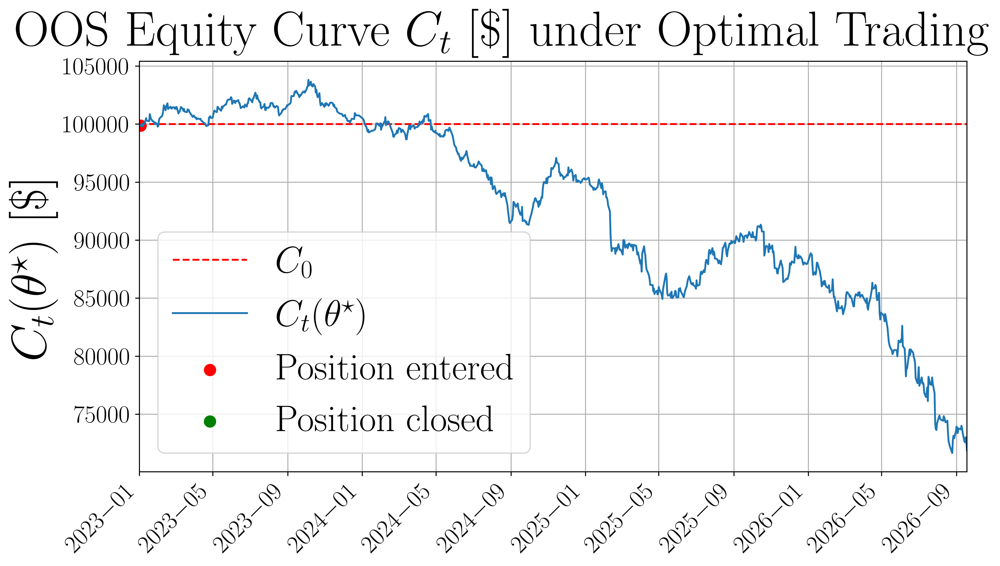

In [21]:
oos_start="2023-01-01"
oos_end="2026-09-20"
theta = opt_results[0]
theta, J, pnl, equity, n_trades, timestamps, entered_positions, closed_positions = optimize_pairs_trading_policy(
    start_date=oos_start,
    end_date=oos_end,
    beta_hat=beta_hat,
    alpha_hat=alpha_hat,
    m_hat=m_hat,
    sigma_u=hat_sigma_u,
    z_entry_grid=[theta[0]],
    z_exit_grid=[theta[1]],
    c=c,
    w=w,
    N_max=N_max,
    L=L,
    C0 = C0,
    Timestamps=True,
    Trades_Timestamps=True,
)


# Display results
md = f"""
**OOS Test - 2023-Present**

| Annualised Sharpe $J^\\star$ | Net P&L | $n_{{\\text{{trades}}}}$ |
|:---:|:---:|:---:|
| {J:.2f} | ${pnl:,.2f} | {n_trades} |
"""
display(Markdown(md))


plt.figure(figsize=(12,6))
plt.axhline(y=C0,color="red",linestyle="--",label="$C_0$")
plt.plot(timestamps,equity,label="$C_t(\\theta^\star)$")
plt.scatter(entered_positions[0],entered_positions[1],s=80,color="red",label="Position entered")
plt.scatter(closed_positions[0],closed_positions[1],s=80,color="green",label="Position closed")
plt.title("OOS Equity Curve $C_t\ [\$]$ under Optimal Trading", fontsize=40,x=0.44,y=1.02)
plt.ylabel("$C_t(\\theta^\star)\ [\$]$", fontsize=40)
plt.xlim([pd.Timestamp("2023-01-01"),timestamps[-1]])
plt.legend(fontsize=30)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Equity Curve with Optimal Policy and Baseline Parameters 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()


The equity curve declines almost monotonically from the end of 2023 onward, losing about $\$27,000$ over roughly $900$ trading days. 
A single position was entered at the beginning of the testing window and was held until forced liquidation at the end of the window.

With only one trade, the reported annualised Sharpe ratio ($-1.16$) is not interpretable as a performance estimate. 
A possible explanation is that the relationship the strategy relies on has shifted. 
Specifically, it may be possible that the spread that no longer mean-reverts within the frozen $\hat m,\hat\sigma_u$. 
The plots below investigate this possibility, from the raw prices to the standardised spread the policy actually acts on. 
A new Engle-Granger cointegration test is performed to establish if the hedge ratio of the two series has mutated, and if the series are still cointegrated in the OOS window.

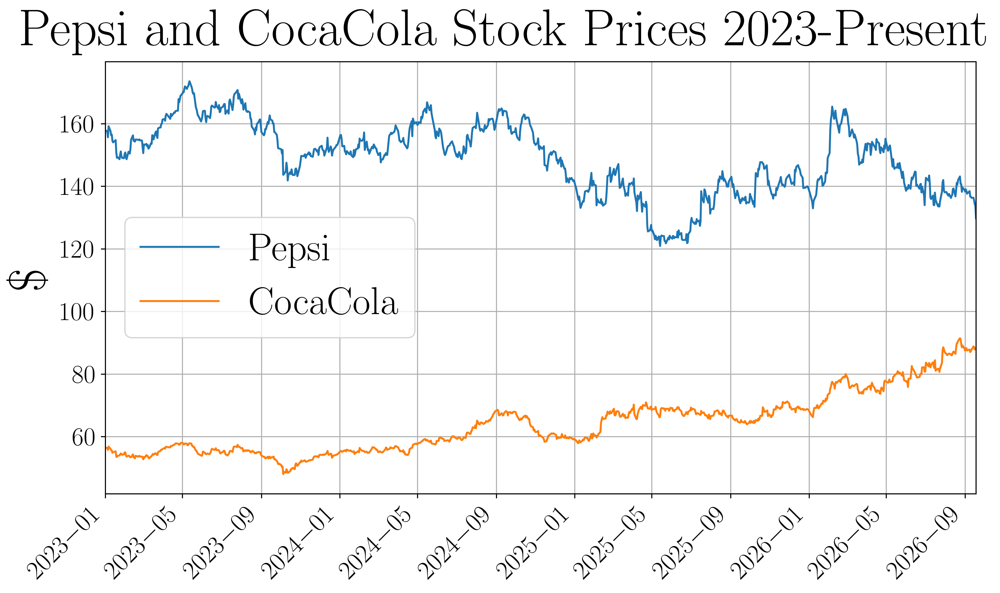

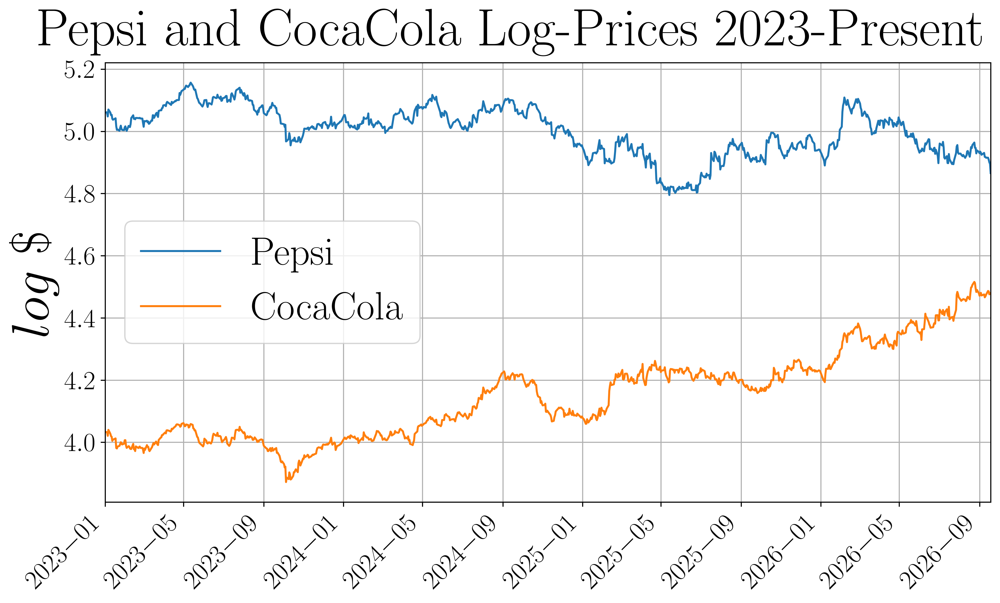

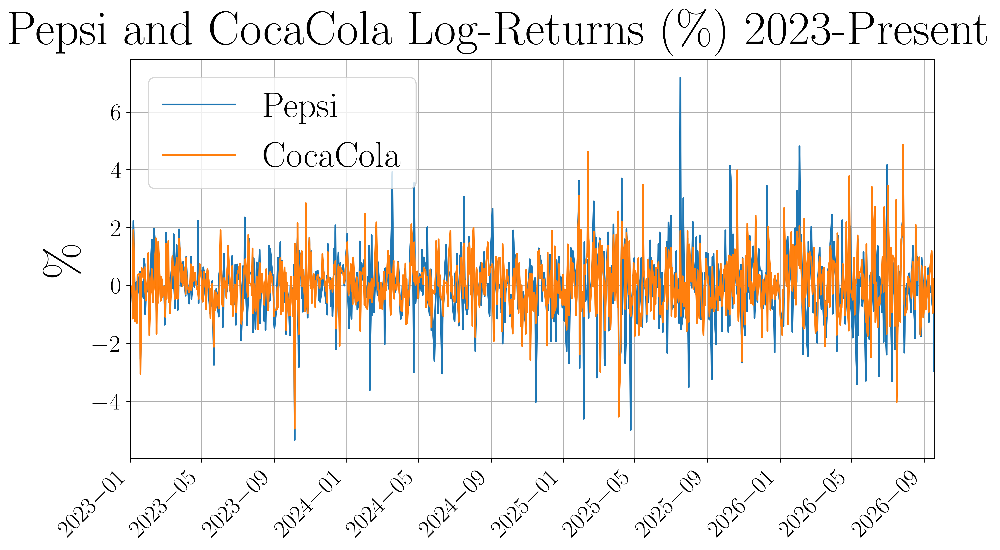

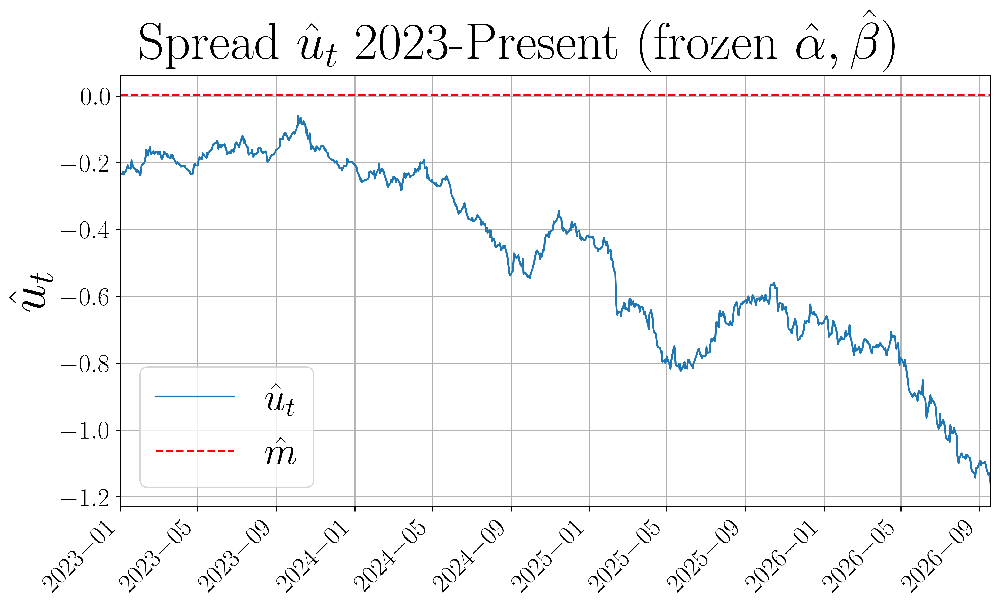

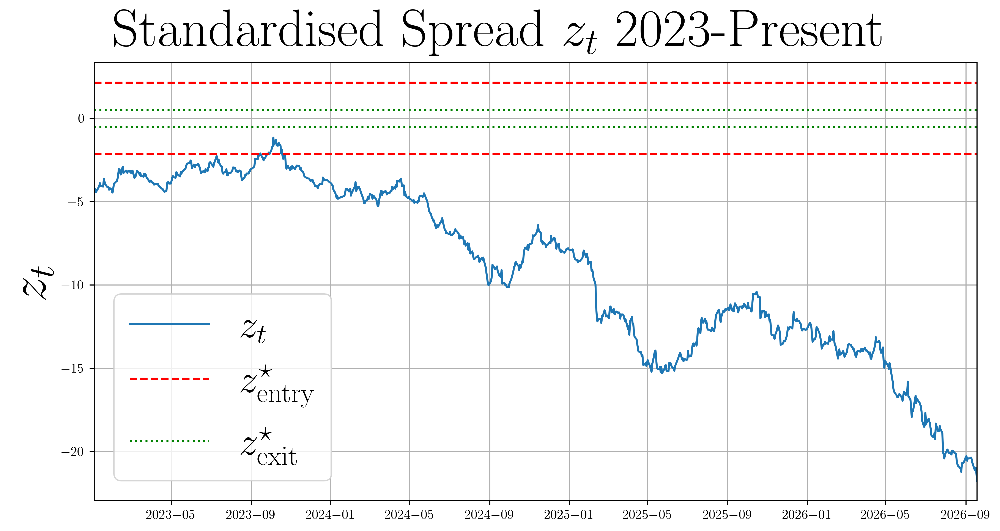


**Post-hoc Engle-Granger Cointegration Test, 2023-Present**

| $\hat\beta_{\text{OOS}}$ | ADF statistic | $p$-value | 5% critical value |
|:---:|:---:|:---:|:---:|
| -0.2376 | -2.9599 | 0.0388 | -2.8647 |


In [22]:
# Step 1. Prices, log-prices, returns
data_oos = yf.download(
    ["PEP", "KO"], 
    start=oos_start, 
    end=oos_end,
    auto_adjust=True, 
    progress=False
)
prices_oos = data_oos["Close"].dropna(subset=["PEP", "KO"])
timestamps = prices_oos.index
pep_oos = prices_oos["PEP"].to_numpy()
ko_oos  = prices_oos["KO"].to_numpy()
T_oos = len(pep_oos) - 1

pep_oos_log = np.log(pep_oos)
ko_oos_log  = np.log(ko_oos)
pep_oos_ret = np.log(pep_oos[1:] / pep_oos[:-1])
ko_oos_ret  = np.log(ko_oos[1:]  / ko_oos[:-1])

#         Plot: prices
plt.figure(figsize=(12,6))
plt.plot(timestamps,pep_oos)
plt.plot(timestamps,ko_oos)
plt.title("Pepsi and CocaCola Stock Prices 2023-Present", fontsize=40,x=0.46,y=1.02)
plt.ylabel("$\\$$", fontsize=40)
plt.xlim([pd.Timestamp("2023-01-01"),timestamps[-1]])
plt.legend(["Pepsi", "CocaCola"], fontsize=30)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Historical Prices 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

#         Plot: log-prices
plt.figure(figsize=(12,6))
plt.plot(timestamps,pep_oos_log)
plt.plot(timestamps,ko_oos_log)
plt.title("Pepsi and CocaCola Log-Prices 2023-Present", fontsize=40,x=0.46,y=1.02)
plt.ylabel("$log\\ \\$$", fontsize=40)
plt.xlim([pd.Timestamp("2023-01-01"),timestamps[-1]])
plt.legend(["Pepsi", "CocaCola"], fontsize=30)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Log-Prices 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

#         Plot: log-returns
plt.figure(figsize=(12,6))
plt.plot(timestamps[1:],pep_oos_ret * 100)
plt.plot(timestamps[1:],ko_oos_ret * 100)
plt.xlim([timestamps[0],timestamps[-1]])
plt.title("Pepsi and CocaCola Log-Returns $(\\%)$ 2023-Present", fontsize=40,x=0.46,y=1.02)
plt.ylabel("$\\%$", fontsize=40)
plt.xlim([pd.Timestamp("2023-01-01"),timestamps[-1]])
plt.legend(["Pepsi", "CocaCola"], fontsize=30)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Log-Returns 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

# Step 3. Spread and z-score
u_oos = pep_oos_log - beta_hat * ko_oos_log - alpha_hat
z_oos = (u_oos - m_hat) / hat_sigma_u

#         Plot: spread
plt.figure(figsize=(12,6))
plt.plot(timestamps,u_oos, label="$\\hat u_t$")
plt.axhline(m_hat, color='r', linestyle='--', label="$\\hat m$")
plt.title("Spread $\\hat u_t$ 2023-Present (frozen $\\hat\\alpha,\\hat\\beta$)", fontsize=40,x=0.46,y=1.02)
plt.ylabel("$\\hat u_t$", fontsize=40)
plt.xlim([pd.Timestamp("2023-01-01"),timestamps[-1]])
plt.legend( fontsize=30)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Estimated Spread with Frozen Hedge Ratio 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

#         Plot: z-score
plt.figure(figsize=(12,6))
plt.plot(timestamps,z_oos, label="$z_t$")
plt.axhline(theta[0], color='r', linestyle='--', label="$z_{\\mathrm{entry}}^\\star$")
plt.axhline(-theta[0], color='r', linestyle='--')
plt.axhline(theta[1], color='g', linestyle=':', label="$z_{\\mathrm{exit}}^\\star$")
plt.axhline(-theta[1], color='g', linestyle=':')
plt.title("Standardised Spread $z_t$ 2023-Present", fontsize=40,x=0.46,y=1.02)
plt.ylabel("$z_t$", fontsize=40)
plt.legend(fontsize=30)
plt.xlim([timestamps[0],timestamps[-1]])
plt.grid()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Z-Score with Frozen Hedge Ratio 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

# Step 4. Post-hoc Engle-Granger cointegration test on the OOS window
X_ko_oos_const = sm.add_constant(ko_oos_log)
ols_model_oos = sm.OLS(pep_oos_log, X_ko_oos_const).fit()
u_hat_oos_refit = ols_model_oos.resid

result_oos = adfuller(u_hat_oos_refit, regression='c', autolag='AIC', result_object=False)
adf_stat_oos, pvalue_oos, used_n_oos, nobs_oos, crit_values_oos, icbest_oos = result_oos

#         Display results
md = f"""
**Post-hoc Engle-Granger Cointegration Test, 2023-Present**

| $\\hat\\beta_{{\\text{{OOS}}}}$ | ADF statistic | $p$-value | 5% critical value |
|:---:|:---:|:---:|:---:|
| {ols_model_oos.params[1]:.4f} | {adf_stat_oos:.4f} | {pvalue_oos:.4f} | {crit_values_oos['5%']:.4f} |
"""
display(Markdown(md))

As anticipated earlier, the two companies' comovement no longer mirrors the trend observed in 2013–2018. 
CocaCola trends persistently upward, while Pepsi oscillates without a clear trend. 
As a consequence, the spread $\hat u_t=X_t^{\mathrm{PEP}}-\hat\beta X_t^{\mathrm{KO}}-\hat\alpha$ (estimated with the 2013-2018 frozen parameters) and the corresponding standardised spread decline almost monotonically. 
In particular, the latter briefly approaches the entry band near the end of 2023 before starting its decline and never returns to the exit band $|z_t|<0.50$. 
Therefore, the strategy enters long the spread early (when $z_t<-2.15$), then holds the position unitl forced liquidation.

Re-estimating the hedge ratio on 2023–present data gives $\hat\beta_{\mathrm{OOS}}=-0.2378$. 
This is not just a different magnitude, but also the opposite sign from the training-period $\hat\beta=1.6618$. 
The ADF test on the resulting residuals is moderately significant ($p=0.039$, clearing the 5% threshold).

The long-run relationship the strategy was built on appears to have shifted over the 2023–present window. 
The single loss-making trade is therefore best explained by regime change in the two companies' relationship.

## Rolling Hedge Ratio

The backtest with static $\beta$ assumes that the long-run relationship $X_t^{\text{PEP}}\approx\beta X_t^{\text{KO}}+\alpha$ is constant over the entire sample. 
However, the OOS diagnosis above shows that the re-estimated OOS hedge ratio has the opposite sign with respect to the frozen hedge ratio $\hat\beta$ estimated during the training window 2013–2018. 
Therefore, the frozen $\hat\beta$ produces a spread $\hat u_t$ that no longer captures the PEP/KO long-run relationship in the OOS window.
This motivates the estimation of an adaptive hedge ratio $\beta_t$, so as to re-calibrate the spread as the relationship changes: this could avoid the pathological single-entry trade with forced liquidation seen in the frozen-parameter OOS run.
To this end, we consider two standard approaches:

**Rolling OLS.** 
At each $t$, $(\hat\alpha_t,\hat\beta_t)$ is re-estimated by OLS regression of $X_t^{\text{PEP}}$ on $X_t^{\text{KO}}$ using only the trailing $M$-day window $[t-M,t)$, using no information beyond $t-1$ to avoid look-ahead. 
This introduces a new tuning parameter $M$, subject to the same tradeoff already seen with the volatility window $L$: a short $M$ tracks genuine drift quickly but is noisy; a long $M$ is more stable but lags behind real changes in the relationship.

**Kalman filter.** 
$\beta_t$ is modelled as an unobserved state following a random walk,
$$
\beta_t = \beta_{t-1} + w_t, \qquad w_t\overset{\mathrm{i.i.d.}}{\sim}\mathcal N(0,\sigma_w^2),
$$
with observation equation 
$$
X_t^{\text{PEP}} = \alpha + \beta_t X_t^{\text{KO}} + \varepsilon_t,\qquad \varepsilon_t\overset{\mathrm{i.i.d.}}{\sim}\mathcal N(0,\sigma_\varepsilon^2).
$$
The filter produces the minimum-mean-square-error estimate $\hat\beta_{t\mid t}$ recursively from $\hat\beta_{t-1\mid t-1}$ and the new observation at $t$, with the update weight (Kalman gain) set automatically by the ratio $\sigma_w^2/\sigma_\varepsilon^2$. 
Like rolling OLS, it only ever conditions on data up to $t-1$, preserving the no-look-ahead property.

What follows re-estimates $\beta_t$ adaptively and re-runs it only on the 2023–present window as a plausibility check of the failure diagnosis. 
However, it does not repeat the walk-forward validation, robustness, or ASR/DSR analysis performed for the static model. 
A rolling/Kalman hedge ratio introduces its own parameters ($M$, or $\sigma_w^2/\sigma_\varepsilon^2$) that would need the same scrutiny before any performance claim could be posed on solid grounds.

**Note**. A detailed account of the implementation can be found in Appendix B.

In [23]:
# Adaptive Hedge Ratio Estimators and Policy Simulator

# Data Retrieval with lookback buffer
def download_buffered_prices(start_date, end_date, K):
    """
    Shared price-extraction routine: downloads PEP/KO close prices for
    [start_date, end_date), plus a K-day lookback buffer immediately
    preceding start_date.
    """
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)

    lookback_start = start_date - pd.Timedelta(days=3 * K)
    data_lookback = yf.download(
        ["PEP", "KO"], start=lookback_start, end=start_date,
        auto_adjust=True, progress=False,
    )
    prices_lookback = data_lookback["Close"].dropna(subset=["PEP", "KO"])
    prices_lookback = prices_lookback.iloc[-K:]

    data_main = yf.download(
        ["PEP", "KO"], start=start_date, end=end_date,
        auto_adjust=True, progress=False,
    )
    prices_main = data_main["Close"].dropna(subset=["PEP", "KO"])

    prices = pd.concat([prices_lookback, prices_main])
    price_pep = prices["PEP"].to_numpy()
    price_ko = prices["KO"].to_numpy()

    return price_pep, price_ko, prices.index

def unbuffer_lookback(Y, X, alpha_t_buf, beta_t_buf, start_date_idx, M, L):
    """
    From the OOS start date onwards, compute the adaptive hedge-ratio parameters, 
    the spread statistics and the standardised spread, using the lookback buffer as
    warm-up so that every quantity is well-defined from the OOS start date onwards,
    and at time t only data up to t-1 are used.

    Parameters
    ----------
    Y, X : array-like of float, length T
        Full buffered dependent variable and regressor series, respectively.
    alpha_t_buf, beta_t_buf : array-like of float, length T - M
        Filtered intercept and hedge ratio from adaptive hedge ratio estimation,
        covering times t = M, ..., T-1 (the first M days are for the estimation warm-up).
    start_date_idx : int
        Index in Y/X of the first OOS day. It must satisfy 
        
                    start_date_idx >= 2*M+L+1

        so that alpha/beta, mu/sigma and z are all available from that day.
    M : int
        Warm-up window (days) for the adaptive hedge ratio estimators, also used as the 
        trailing window for mu_t and sigma_t.
    L : int
        Trailing window (days) for the volatility of daily changes sigma_{Delta z}^L.

    Returns
    -------
    alpha_t, beta_t : ndarray
        Filtered intercept and hedge ratio from OOS start date onwards.
    mu_t, sigma_t : ndarray
        Trailing M-day sample mean and std of the spread, using data
        up to t-1, from the OOS start date onwards.
    z_t : ndarray
        Standardised spread from the the OOS date onwards.
    sigma_delta_z_L : ndarray
        Trailing L-day std of daily changes in z_t, using data up to t-1.
    """
    #   (i) Remove buffer from alpha_t_buf and beta_t_buf for OOS test.
    #       Note: M indices were already lost, since rolling hedge ratio 
    #       estimation requires M days to warm up (to avoid look-ahead)
    alpha_t = alpha_t_buf[start_date_idx-M:]
    beta_t = beta_t_buf[start_date_idx-M:]
    #  (ii) Compute spread with buffer (beware of the index alignment due to rolling window) and ...
    u_t_buf = Y[M:] - alpha_t_buf - beta_t_buf * X[M:]
    #       ... estimate its sample mean mu_t and std sigma_t at time t over an M-day trailing
    #       window using only data up to t-1 to avoid look-ahead (these are needed for the 
    #       standardised spread; uses M additional days in the buffer) and ...
    u_t_buf_series = pd.Series(u_t_buf)
    mu_t_buf = u_t_buf_series.rolling(M).mean().shift(1).dropna().to_numpy()            # the shift is to avoid look-ahead
    sigma_t_buf  = u_t_buf_series.rolling(M).std(ddof=1).shift(1).dropna().to_numpy()
    #       ... extract the unbuffered series for the OOS test (beware of the index alignment
    #       again since M entries were lost)
    mu_t = mu_t_buf[start_date_idx-2*M:]
    sigma_t = sigma_t_buf[start_date_idx-2*M:]
    # (iii) Compute standardised spread and remove buffer (beware of the index alignment)
    z_t_buf = (u_t_buf[M:]-mu_t_buf)/sigma_t_buf
    z_t = z_t_buf[start_date_idx-2*M:]
    #  (iv) Compute volatility of daily Delta z_t over an L-day trailing window using only
    #       data up to t-1 to avoid look-ahead (uses L+1 additional days in the buffer) and ...
    sigma_delta_z_L_buf = pd.Series(np.diff(z_t_buf)).rolling(L).std(ddof=1).shift(1).dropna().to_numpy()
    #       ... extract the unbuffered series (only necessary if start_date_idx > 2*M + L + 1)
    sigma_delta_z_L = sigma_delta_z_L_buf[start_date_idx-2*M-L-1:]

    return alpha_t,beta_t,mu_t,sigma_t,z_t,sigma_delta_z_L

# Rolling OLS
def rolling_ols_adaptive_hedge_ratio(Y,X,W):
    """
    Rolling OLS estimation of a time-varying hedge ratio over a trailing window 
    of length W: Y_t = alpha_t + beta_t X_t + noise

    **Beware:** len(alpha_t)=len(beta_t) = len(X_t) - W

    Parameters
    ----------
    Y,X: array-like of float
    W: int, window length

    Returns
    -------
    alpha_t,beta_t: array-like of float
        Time-varying intercept and hedge ratio
    """
    T = len(Y)
    alpha_t = np.full(T-W, np.nan)
    beta_t = np.full(T-W, np.nan)

    for t in range(W, T):
        y = Y[t-W:t]
        x = X[t-W:t]
        x_const = sm.add_constant(x)    # add intercept
        fit = sm.OLS(y, x_const).fit()
        alpha_t[t-M], beta_t[t-M] = fit.params

    return alpha_t, beta_t


# Kalman Filter
def estimate_Ve(Y,X):
    """
    Static OLS fit: Y_t = alpha_0 + beta_0 X_t + noise

    Parameters
    ----------
    Y,X: array-like of float

    Returns
    -------
    alpha_0,beta_0: float 
        intercept and rolling hedge
    Ve: float
        Sample variance of the residual u_t = Y_t-alpha_0-beta_0*X_t
    """
    fit = sm.OLS(Y, sm.add_constant(X)).fit()
    alpha0, beta0 = fit.params
    return alpha0, beta0, fit.resid.var(ddof=1)


def kalman_adaptive_hedge_ratio(Y,X, delta, theta0, P0_scale, Ve, M, halflife=252):
    """
    Estimate a time-varying intercept and hedge ratio for the regression

                Y_t = alpha_t + beta_t * X_t + noise

    with a two-state Kalman filter, where [alpha_t, beta_t] follows a random walk.

    To improve numerical conditioning, X is centred on a slowly moving mean m_t,
    computed as an exponentially weighted moving average (EWMA) of X using data only 
    up to t-1 (no look-ahead). 
    
    The filter runs in centred coordinates [alpha_{c,t}, beta_t], with 
    
                alpha_{c,t} = alpha_t + beta_t * m_t. 

    Whenever m_t moves, the state and covariance are re-computed so that the change of centre is
    not misread as new information. Outputs are converted back to the original
    (uncentred) coordinates.

    **Beware:** len(alpha_t) = len(beta_t) = len(X) - M  (see the description of M)

    Parameters
    ----------
    Y, X : array-like of float
        Dependent variable and regressor observations, respectively.
    delta : float in (0, 1)
        State-evolution parameter. Sets the random-walk noise covariance, namely
        Vw = delta / (1 - delta) * Id. Larger values let alpha and beta change
        faster; smaller values make them more intertial.
    theta0 : array-like of float, shape (2,)
        Initial state [alpha_0, beta_0] in original coordinates.
    P0_scale : float
        Initial state uncertainty; the initial covariance is P0_scale * Id.
    Ve : float
        Observation-noise variance. Larger values make the filter trust each new
        observation less, so estimates react more slowly to prediction errors.
    M : int
        Length of the initial window. It sets the starting centre m_0 = mean(X[:M]) 
        and the first filtered time index (the filter runs for t = M, ..., T-1). 
        At each t, the centre uses only X up to t-1.
    halflife : float, default 252
        Smoothing parameter of the centre's EWMA, in observations. The update is

                   m_t = m_{t-1} + lambda * (X[t-1] - m_{t-1}),  where

                lambda = 1 - 0.5 ** (1 / halflife),

        so a halflife-steps-old X_t observation carries half the weight of the
        most recent one. It only controls how fast the centre tracks X's levels.
        Small values of halflife make m_t follow X closely, large values keep it 
        nearer to its initial value. The default of 252 is about one trading year 
        of daily data. Because the state is re-mapped whenever m_t moves, the
        filtered (alpha, beta) depend only weakly on this choice.

    Returns
    -------
    alpha_t : ndarray
        Filtered intercept at each time t, in original (not centred) coordinates.
    beta_t : ndarray
        Filtered hedge ratio at each time t.
    """
    T = len(Y)
    lam = 1 - 0.5 ** (1 / halflife)

    m = X[:M].mean()                        # initial centre (data up to OOS start)
    Vw = delta / (1 - delta) * np.eye(2)

    theta = np.array(theta0, dtype=float)      # copy (avoids mutating the caller's theta0=
    theta[0] += theta[1] * m                   # shift to centred coordinates
    P = P0_scale * np.eye(2)

    alpha_t = np.empty(T-M)
    beta_t = np.empty(T-M)

    for t in range(M,T):
        # Step 1. Update centre using only data through t-1, then re-map state
        if t > M:
            m_new = m + lam * (X[t-1]-m)
            dm = m_new - m
            theta[0] += theta[1] * dm
            A = np.array([[1.0, dm], [0.0, 1.0]])
            P = A @ P @ A.T
            m = m_new

        # Step 2. Kalman update in centred coordinates
        H = np.array([1.0, X[t] - m])
        P_pred = P + Vw
        e = Y[t] - H @ theta
        Q = H @ P_pred @ H + Ve
        K = P_pred @ H / Q
        theta = theta + K * e
        P = P_pred - np.outer(K, H) @ P_pred

        # Step 3. Convert to original (non-centred) coordinates
        alpha_t[t-M] = theta[0] - theta[1] * m
        beta_t[t-M] = theta[1]

    return alpha_t, beta_t


# Simulate policy with adaptive hedge ratio
def simulate_single_policy_adaptive(
    price_pep, 
    price_ko, 
    X_pep,
    X_ko,
    dates,
    alpha_t, 
    beta_t,
    mu_t,
    sigma_t,
    z_t,
    sigma_delta_z_L,
    z_entry, 
    z_exit, 
    c, 
    w, 
    N_max, 
    C0,
    Trades_Timestamps=False,
):
    # initialise variables
    T = len(z_t)
    C = np.zeros(T)
    C[0] = C0      

    position = 0
    S_pep = S_ko = N_open = 0.0
    alpha_open = beta_open = mu_open = sigma_open = 0.0
    n_trades = 0
    if Trades_Timestamps:
        entered_positions = [[], []]
        closed_positions = [[], []]

    # run
    for t in range(T):
        if t>0:
            C[t] = C[t-1]

        if position != 0:
            C[t] += S_pep * (price_pep[t] - price_pep[t - 1]) \
                   + S_ko * (price_ko[t] - price_ko[t - 1])

        # exit check (signal from the frozen entry parameters)
        if position != 0:
            u_t_frozen = X_pep[t] - alpha_open - beta_open * X_ko[t]
            z_t_frozen = (u_t_frozen - mu_open) / sigma_open if sigma_open > 0 else np.nan

            if not np.isnan(z_t_frozen) and abs(z_t_frozen) < z_exit:
                C[t] -= c * N_open * (1.0 + abs(beta_open))
                position = 0
                S_pep = S_ko = N_open = 0.0
                alpha_open = beta_open = mu_open = sigma_open = 0.0
                if Trades_Timestamps:
                    closed_positions[0].append(dates[t])
                    closed_positions[1].append(C[t])

        # entry check (signal from the current estimate z_t)
        elif position == 0:

            if z_t[t] > z_entry:
                position = -1       # short the spread
            elif z_t[t] < -z_entry:   
                position = +1       # long the spread

            if position != 0:
                sigma_hat = sigma_delta_z_L[t]
                if sigma_hat > 0 and np.isfinite(sigma_hat) and sigma_t[t] > 0:
                    R_t = w * C[t]
                    N_t = min(R_t / sigma_hat, N_max * C[t])

                    alpha_open = alpha_t[t]
                    beta_open = beta_t[t]
                    mu_open = mu_t[t]
                    sigma_open = sigma_t[t]

                    S_pep = position * N_t / price_pep[t]
                    S_ko = -position * beta_open * N_t / price_ko[t]
                    N_open = N_t
                    C[t] -= c * N_open * (1.0 + abs(beta_open))
                    n_trades += 1
                    if Trades_Timestamps:
                        entered_positions[0].append(dates[t])
                        entered_positions[1].append(C[t])

    if position != 0:
        C[-1] -= c * N_open * (1.0 + abs(beta_open))

    equity = C
    pnl = equity[-1] - equity[0]
    daily_returns = np.diff(equity) / equity[:-1]

    mu_r = daily_returns.mean()
    sigma_r = daily_returns.std(ddof=1)
    J = (mu_r / sigma_r) * np.sqrt(252) if sigma_r > 0 else -np.inf

    if n_trades == 0:
        pnl, J = 0, 0

    if Trades_Timestamps:
        return pnl, J, equity, n_trades, entered_positions, closed_positions
    else:
        return pnl, J, equity, n_trades



**OOS Test 2023–Present, Adaptive Hedge Ratio Estimators ($M$=504 days)**

| Estimator | Annualised Sharpe $J^\star$ | Net P&L | $n_{\text{trades}}$ |
|---|:---:|:---:|:---:|
| Rolling OLS | -1.06 | $-998.42 | 1 |
| Kalman filter | -0.84 | $-251.18 | 5 |


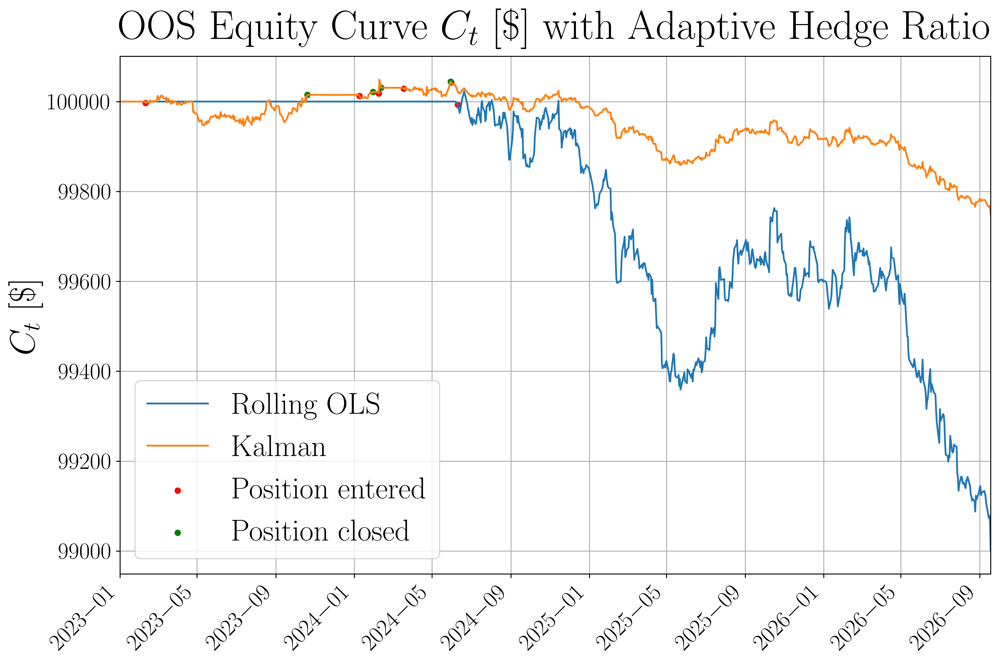

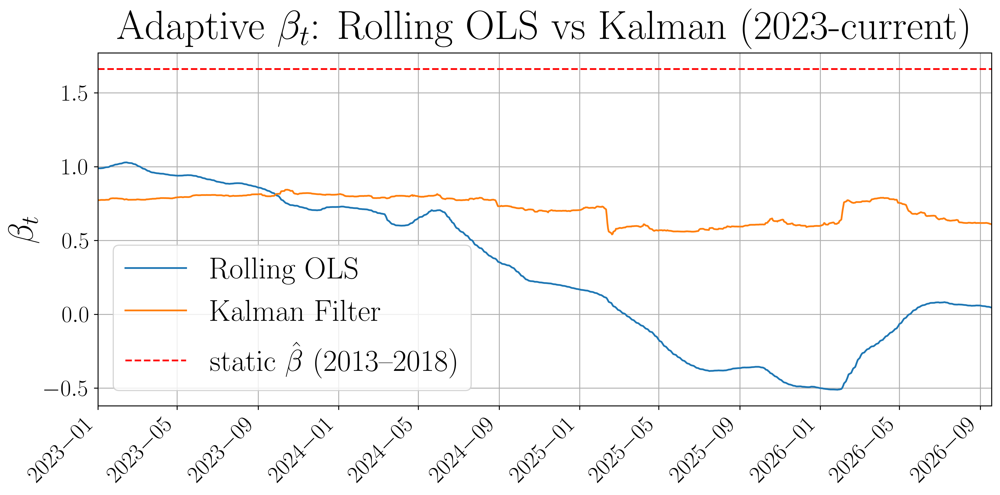

In [ ]:
# Simulations

# Step 0. Parameters and buffered/unbuffered price series
M = 252 * 2   # 2 trading years (tuning parameter)

#         To set the number of days in the lookback buffer, note:
#            (i) alpha_t/beta_t need data from M days before the OOS start date to warm up for both approaches;
#           (ii) mu_t and sigma_u_t then need M more days of valid u_t to fill their own rolling window; 
#          (iii) sigma_delta_z_L needs L+1 more days on top of that to compute sigma_{Delta z}^L at t = OOS 
#                start date using only data available before the OOS start date (1 day is lost for the differences,
#                and L additional days are used for the volatility window warm-up).
#         Therefore, the total lookback buffer has to satisfy K > 2*M + L + 1 
K = 2*M+L+1     

#         Retrieve buffered series and fix the OOS start date index
price_pep_buf, price_ko_buf, dates_buf = download_buffered_prices(oos_start, oos_end, K)
oos_start_idx = int(np.searchsorted(dates_buf.values, pd.Timestamp(oos_start).to_datetime64()))
X_pep_buf = np.log(price_pep_buf)
X_ko_buf = np.log(price_ko_buf)

#         Remove buffer for OOS test
price_pep = price_pep_buf[oos_start_idx:]
price_ko = price_ko_buf[oos_start_idx:]
X_pep = X_pep_buf[oos_start_idx:]
X_ko = X_ko_buf[oos_start_idx:]
dates = dates_buf[oos_start_idx:]


# Step 1. Rolling OLS 
alpha_t_OLS_buf, beta_t_OLS_buf = rolling_ols_adaptive_hedge_ratio(X_pep_buf, X_ko_buf, M)
alpha_t_OLS,beta_t_OLS,mu_t_OLS,sigma_t_OLS,z_t_OLS,sigma_delta_z_L_OLS = unbuffer_lookback(X_pep_buf,X_ko_buf,alpha_t_OLS_buf,beta_t_OLS_buf,oos_start_idx,M,L)
pnl_ols, J_ols, equity_ols, n_trades_ols, entered_positions_ols, closed_positions_ols = simulate_single_policy_adaptive(
    price_pep=price_pep, 
    price_ko=price_ko, 
    X_pep=X_pep,
    X_ko=X_ko,
    dates=dates,
    alpha_t=alpha_t_OLS, 
    beta_t=beta_t_OLS,
    mu_t=mu_t_OLS,
    sigma_t=sigma_t_OLS,
    z_t=z_t_OLS,
    sigma_delta_z_L=sigma_delta_z_L_OLS,
    z_entry=opt_results[0][0], 
    z_exit=opt_results[0][1],
    c=c, 
    w=w, 
    N_max=N_max, 
    C0=C0,
    Trades_Timestamps=True,
)

# Step 2. Kalman filter
#            (i) Estimate prior and std of residual errors using M days before the OOS
#                start date for the Kalman filter
alpha0, beta0, Ve = estimate_Ve(X_pep_buf[oos_start_idx-M:oos_start_idx],X_ko_buf[oos_start_idx-M:oos_start_idx],)
#           (ii) Estimate adaptive hedge ratio parameters via the Kalman filter
alpha_t_KF_buf, beta_t_KF_buf = kalman_adaptive_hedge_ratio(
    X_pep_buf, 
    X_ko_buf,
    delta=1e-4, 
    theta0=[alpha0, beta0], 
    P0_scale=1e-3, 
    Ve=Ve,
    M=M,
)
#         (iii) Unbuffer the series and run simulation
alpha_t_KF,beta_t_KF,mu_t_KF,sigma_t_KF,z_t_KF,sigma_delta_z_L_KF = unbuffer_lookback(X_pep_buf,X_ko_buf,alpha_t_KF_buf,beta_t_KF_buf,oos_start_idx,M,L)
pnl_kf, J_kf, equity_kf, n_trades_kf, entered_positions_kf, closed_positions_kf = simulate_single_policy_adaptive(
    price_pep=price_pep, 
    price_ko=price_ko, 
    X_pep=X_pep,
    X_ko=X_ko,
    dates=dates,
    alpha_t=alpha_t_KF, 
    beta_t=beta_t_KF,
    mu_t=mu_t_KF,
    sigma_t=sigma_t_KF,
    z_t=z_t_KF,
    sigma_delta_z_L=sigma_delta_z_L_KF,
    z_entry=opt_results[0][0], 
    z_exit=opt_results[0][1],
    c=c, 
    w=w, 
    N_max=N_max, 
    C0=C0,
    Trades_Timestamps=True,
)

# Results table
md = f"""
**OOS Test 2023–Present, Adaptive Hedge Ratio Estimators ($M$={M} days)**

| Estimator | Annualised Sharpe $J^\\star$ | Net P&L | $n_{{\\text{{trades}}}}$ |
|---|:---:|:---:|:---:|
| Rolling OLS | {J_ols:.2f} | ${pnl_ols:,.2f} | {n_trades_ols} |
| Kalman filter | {J_kf:.2f} | ${pnl_kf:,.2f} | {n_trades_kf} |
"""
display(Markdown(md))

# Equity curve
plt.figure(figsize=(12, 8))
plt.plot(dates, equity_ols, label="Rolling OLS")
plt.plot(dates, equity_kf, label="Kalman")
plt.scatter(entered_positions_ols[0], entered_positions_ols[1], s=20, color="red", label="Position entered")
plt.scatter(closed_positions_ols[0], closed_positions_ols[1], s=20, color="green", label="Position closed")
plt.scatter(entered_positions_kf[0], entered_positions_kf[1], s=20, color="red")
plt.scatter(closed_positions_kf[0], closed_positions_kf[1], s=20, color="green")
plt.title("OOS Equity Curve $C_t\\ [\\$]$ with Adaptive Hedge Ratio", fontsize=35, y=1.02)
plt.ylabel("$C_t\\ [\\$]$", fontsize=30)
plt.xlim([pd.Timestamp("2023-01-01"), dates[-1]])
plt.legend(fontsize=26)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
plt.tight_layout()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Equity Curves with Optimal Policy and Adaptive Hedge Ratios 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

# Rolling hedge ratio beta_t, shown over the actual OOS window only
plt.figure(figsize=(12, 6))
plt.plot(dates, beta_t_OLS, label="Rolling OLS")
plt.plot(dates, beta_t_KF, label="Kalman Filter")
plt.axhline(beta_hat, color='r', linestyle='--', label=r"static $\hat\beta$ (2013–2018)")
plt.title(r"Adaptive $\beta_t$: Rolling OLS vs Kalman (2023-current)", fontsize=35,y=1.02)
plt.ylabel(r"$\beta_t$", fontsize=30)
plt.xlim([pd.Timestamp("2023-01-01"), dates[-1]])
plt.legend(fontsize=26)
plt.xticks(fontsize=20,rotation=45,ha="right")
plt.yticks(fontsize=20)
plt.grid()
plt.tight_layout()
if save_plots:
    plt.savefig("PEP-KO Pairs Trading Strategy - Plots/Adaptive Hedge Ratios 2023-Present.png", dpi=300, bbox_inches="tight")
plt.show()

Both adaptive hedge ratio estimators were evaluated on the same 2023–present OOS window, using the policy $\theta^\star=(2.15,\,0.50)$ optimised with the static model during the 2013-2018 window.

**Rolling OLS** ($M=504$ days, approximately two trading years) captures the hedge ratio drift identified earlier: $\beta_t$ decreases from approximately $1$ to $-0.5$ before partially recovering, consistent with the sign change found in the earlier OOS re-estimation. 
The strategy remains flat for the first 18 months and then executes a single trade in mid-2024. 
However, this position is closed only by forced liquidation at the end of the sample, resulting in a net loss of $\$998$ ($J^\star=-1.06$).
The **Kalman filter** also captures the hedge ratio drift, though with a significantly smoother trajectory than rolling OLS. 
It executes five trades, all within the first 18 months and only yielding modest gains, and it ends the sample with a net P\&L of $\$−251$ ($J^\star=-0.84$).

Both estimators substantially reduce losses relative to the backtest with a static hedge ratio $(\$−27,000)$, which is consistent with an adaptive $\beta_t$ tracking the evolving relationship between the two assets more closely at entry.
With only $n=1$ and $n=5$ trades, however, neither Sharpe ratio is statistically meaningful.

Neither estimator renders the strategy profitable. 
The results presented above provide evidence – although weak – that hedge ratio drift is a major contributor to the failure of the static model over the 2023–present window, since both hedge ratio estimators reduce the loss by more than an order of magnitude. 
They do not, however, establish drift as the sole explanation, since both equity curves continue to decline after mid-2024 while a position is open.
This suggests a residual source of failure, for instance a spread that no longer exhibits the mean reversion assumed by the policy.

# Conclusion

Across the full analysis, the consistent finding is that any apparent edge in this PEP/KO pairs trade is not statistically distinguishable from what a search over hundreds of policies would produce by chance, and does not survive genuinely out-of-sample testing. 
The exercise is best read as a case study in why in-sample backtest performance, however carefully optimised, is insufficient evidence of a tradeable strategy.

# Appendix A - Classical Results

The two standard results referenced above (the AR(1) stationarity regimes, and the
weak-stationarity equivalence) are reproduced here in full for completeness.

## A.1 $AR(1)$ Regimes and Equilibrium


Let $\{P_t\}$ be the price process of a company, and denote by $X_t := \log P_t$ its log-price. 
We model the log-price processes as **first-order autoregressive models** (AR(1)):
\begin{equation}
    X_t = \alpha + \rho X_{t-1} + \varepsilon_t, \qquad t\in\mathbb{N},
\end{equation}
where $\alpha\in\mathbb{R}$ is a constant offset, $\rho\in\mathbb{R}$ is the *autoregressive coefficient*, and $\varepsilon_t$ is a *random shock* (e.g., white noise). 
The factor $\rho$ determines the qualitative behaviour of the stochastic processes:
- if $|\rho|>1$, then the dynamics are unstable, hence the process can develop blowup behaviour;
- if $|\rho| = 1$, then the dynamics are marginally stable: a shock today can accumulate permanently or result in oscillatory behaviour;
- if $|\rho|<1$, then the dynamics are stable, namely the effect of the initial condition and old shocks decays, and the process fluctuates around its equilibrium.  

Throughout, we assume the following.

**Assumption 1.** *The noise process $\{\varepsilon_t\}$ is white noise with $$ \mathbb{E}[\varepsilon_t] = 0, \qquad \operatorname{Var}(\varepsilon_t) = \sigma^2, \qquad\operatorname{Cov}(\varepsilon_s,\varepsilon_t)=0\ \ (s\neq t),$$ and $$\qquad\operatorname{Cov}(\varepsilon_t,X_0)=0\qquad \textit{for all }\; t.$$*

If $X_t$ has a constant equilibrium $m\in\mathbb{R}$, then $(1)$ implies 
$$ m = \alpha + \rho m. $$
Therefore, if $\rho\neq 1$, this yields
$$ m = \frac{\alpha}{1-\rho}.$$
Denoting the deviation from equilibrium by
$$ Y_t = X_t-m,\qquad t\in\mathbb{N},$$
model $(1)$ becomes
\begin{equation}
    Y_t = \rho Y_{t-1}+\varepsilon_t. \tag{2}
\end{equation}
Iterating backwards, there holds
$$ Y_t = \rho^t Y_{0}+\sum_{j=0}^{t-1}\rho^j\varepsilon_{t-j}, \qquad t\in\mathbb{N}.$$
Hence, if $|\rho|<1$, then $\rho^j\to 0$, and thus old shocks are progressively forgotten. In particular,
$$\mathbb{E}[X_t] = m+\rho^t\big(\mathbb{E}[X_0]-m\big)\to m $$
and
$$\operatorname{Var}(X_t)=\rho^{2t}\operatorname{Var}(X_0)+\frac{\sigma^2(1-\rho^{2t})}{1-\rho^2}\to\frac{\sigma^2}{1-\rho^2}.$$
If, instead, $|\rho|>1$, then $|\rho^j|\to\infty$, and the shocks are progressively amplified.
Finally, if $\rho=1$, then $(1)$ yields
$$ X_t = X_0+\alpha t + \sum_{i = 1}^t\varepsilon_i, \qquad t\in\mathbb{N}, $$
and thus the variance increases indefinitely with time:
$$ \operatorname{Var}(Y_t) = \operatorname{Var}(X_t) = t\sigma^2.$$
The above equality also holds when $\rho=-1$, in which case the process may exhibit an alternating accumulation of shocks.    
The dichotomy discussed above, namely convergence of the  mean and variance to finite, time-indipendent limits when $|\rho|<1$ versus indefinite growth of the variance when $|\rho|\geq 1$, is precisely what distinguishes a **stationary** process from a non-stationary one. We next make this notion precise.

## A.2 Weak Stationarity $\Leftrightarrow$ $|\rho|<1$ (Proof)


We consider the following notion of weak stationarity (cf. [Stationary Process](https://en.wikipedia.org/wiki/Stationary_process)).

**Definition 2 $-$ Weak Stationary Stochastic Process.**  
*A stochastic process $\{X_t\}$ is said to be weakly stationary if its first moment is independent of time, its second moments are finite for all times, and its autocovariance only depends on the lag, namely there exists a function $\eta$ such that*
$$\operatorname{Cov}\left(X_{t},X_{t+h}\right)=\eta(h)\quad\textit{for all}\;\ t\;\ \textit{and}\;\ h.$$

**Remark 3.** *Let $\{X_t\}$ be a weakly stationary process. Then, for all times there holds $$\operatorname{Var}(X_t) = \operatorname{Cov}(X_t,X_t) = \eta(0),$$ which implies that the variance is also independent of time.*

The preceding discussion implies that, if Assumption $1$ holds, the process $X_t$ evolving as in $(1)$ admits a weakly stationary solution if and only if $|\rho|<1$.
Indeed, suppose first that $|\rho|<1$ and recall that the equilibrium satisfies
$$m=\frac{\alpha}{1-\rho}.$$
To obtain a weakly stationary solution, we initialise $X_0$ with
$$\mathbb{E}[X_0]=m,\qquad\operatorname{Var}(X_0)=\frac{\sigma^2}{1-\rho^2},$$
and assume that $X_0$ is uncorrelated with $\varepsilon_t$ for all $t\geq1$. 
Then, using $(1)$, a recursive calculation yields
$$
\mathbb{E}[X_t]=\alpha+\rho\mathbb{E}[X_{t-1}]=\alpha+\rho m = m,$$
and hence the first moment is independent of time. 
Moreover,
$$\operatorname{Var}(X_t)=\rho^2\operatorname{Var}(X_{t-1})+\operatorname{Var}(\varepsilon_t)=\rho^2\frac{\sigma^2}{1-\rho^2}+\sigma^2=\frac{\sigma^2}{1-\rho^2},$$
so the second moment is finite for all times.
Finally, for $h\geq0$, iterating $(1)$ gives
$$
X_{t+h} = m+\rho^h(X_t-m)+\sum_{j=0}^{h-1}\rho^j\varepsilon_{t+h-j}.
$$
From $(1)$, $X_{t}$ is a linear combination of $X_0,\varepsilon_1,\cdots,\varepsilon_{t-1}$, all of which are uncorrelated with the future innovations $\varepsilon_{t+h-j}$ by Assumption 1.
Hence,
$$
\operatorname{Cov}(X_t,X_{t+h}) = \rho^h\operatorname{Var}(X_t) = \frac{\sigma^2\rho^h}{1-\rho^2}.
$$
By symmetry, for any $h\in\mathbb{Z}$,
$$
\operatorname{Cov}(X_t,X_{t+h}) = \frac{\sigma^2\rho^{|h|}}{1-\rho^2},
$$
which depends only on the lag $h$. Hence, $X_t$ is weakly stationary.

Conversely, suppose that a weakly stationary solution exists. By Remark 3, there exists $v\in\mathbb{R}$ such that
$$\operatorname{Var}(X_t)=v\quad\text{for all }\,t.$$
Since $X_{t-1}$ is a linear combination of $X_0,\varepsilon_1,\cdots,\varepsilon_{t-2}$, all of which are uncorrelated with $\varepsilon_t$ by Assumption 1, $X_{t-1}$ is uncorrelated with $\varepsilon_t$ for all times. Hence, we compute
$$v=\operatorname{Var}(X_t)=\rho^2\operatorname{Var}(X_{t-1})+\sigma^2=\rho^2v+\sigma^2.$$
Rearranging the previous identity yields
$$v=\frac{\sigma^2}{1-\rho^2}.$$
For $\sigma^2>0$, this is finite and non-negative only if $|\rho|<1$. Thus, the process admits a weakly stationary solution if and only if $|\rho|<1$.  

# Appendix B - Implementation of the Adaptive Hedge Ratio Estimation

This appendix describes how the time-varying hedge ratio $\hat\beta_t$ is computed and implemented in the 2023–present out-of-sample test. 
For notational simplicity, we let $Y_t:=X_t^{\text{PEP}}$ and $X_t:=X_t^{\text{KO}}$ denote the two log-price series. 
The two estimators, i.e. rolling OLS and a Kalman filter, are implemented following the same general procedure, described below.

## B.1. Lookback buffer

For the trading simulation, the following quantities need to be well-defined starting from the first OOS day $(t_0)$ using only past data to avoid look-ahead:
- the rolling hedge ratio and the corresponding intercept $(\hat\alpha_t,\hat\beta_t)$; the estimation of $(\hat\alpha_0,\hat\beta_0)$ requires $M$ days of history (see the next section);
- the trailing (sample) mean $\hat\mu_t$ and standard deviation $\hat\sigma_t$ of the spread require further days of spread values for the estimation to avoid look-ahead; for simplicity, and without loss of generality, we choose the additional number of days to be $M$ again;
- the volatility $\hat\sigma^L_{\Delta z}$ of the standardised spread's daily changes requires $L$ further trading days, plus one day lost to differencing.

A buffer of at least $K=2M+L+1$ trading days preceding $t_0$ is therefore needed for the estimation of all the above quantities. 
In the experiments, the length of the buffer window was set equal to $K$.

In the following, we refer to a series as *buffered* if it is the concatenation of both the buffer and OOS data; conversely, we call a series *unbuffered* if it only contains OOS data. 
For example, $\{X_t\}_{t=0}^{T-1}$ will denote the CocaCola's buffered series, and $\{X_t\}_{t=K}^T$ the corresponding unbuffered series.

## B.2 Adaptive Estimation

The coefficients $(\hat\alpha_t,\hat\beta_t)$ are estimated for $t=M,\cdots,T-1$ using the data $X_t,Y_t$ for $t=0,\cdots,M-1$ for the warm-up of the estimators.

### B.2.1 Rolling OLS

For each $t=M,\dots,T-1$, the coefficients are estimated by OLS on an $M$-day trailing window up to $t-1$, i.e. $[t-M,\,t-1]$:
$$
(\hat\alpha_t,\hat\beta_t)=\operatorname*{arg\,min}_{a,b}\sum_{s=t-M}^{t-1}\left(Y_s-a-bX_s\right)^2 .
$$
The window has fixed length $M$, is re-fitted every day, and excludes day $t$ itself.

### B.2.2 Kalman filter

The state $\theta_t=(\alpha^c_t,\beta_t)^\top$ is modelled as a random walk:
$$
\theta_t=\theta_{t-1}+w_t, \qquad w_t\overset{\mathrm{i.i.d.}}{\sim}\mathcal{N}(0,V_w),
$$ 
where 
$$
    V_w=\tfrac{\delta}{1-\delta}\operatorname{Id}_{2\times 2}, \qquad \delta=10^{-4}.
$$ 
The observation equation is
$$
Y_t=\alpha^c_t+\beta_t\,(X_t-m_t)+\varepsilon_t,\qquad \operatorname{Var}(\varepsilon_t)=V_e,
$$
where $m_t$ is a slowly moving centre for the regressor, introduced only for numerical conditioning. 
The centred intercept relates to the original one by 
$$
\alpha^c_t=\alpha_t+\beta_t m_t;
$$
hence, the estimates are converted back to uncentred coordinates via $\hat\alpha_t=\hat\alpha^c_t-\hat\beta_t m_t$.

*Initialisation.* $\theta_{M-1}$ and $V_e$ are set, respectively, as the OLS coefficients and the sample variance of the residuals of an OLS regression on the $M$ days immediately preceding $t=M$. 
The initial state covariance is set to $P_{M-1}=10^{-3}I_2$, and the initial centre $m_{M-1}$ is the mean of the first $M$ buffered observations of $X$.

*Centre update.* For $t\geq M$, we update 
$$
m_t=m_{t-1}+\lambda\,(X_{t-1}-m_{t-1})
$$
with $\lambda=1-0.5^{1/252}$ (an exponentially weighted average using data up to $t-1$). 
The difference $\Delta m_t=m_t-m_{t-1}$ is then used to re-map the state and its covariance as follows: 
$$
\alpha^c_{t-1}\leftarrow\hat\alpha^c_{t-1}+\hat\beta_{t-1}\,\Delta m_t, \qquad
P_{t-1}\leftarrow A_tP_{t-1}A_{t}^\top,
$$
where
$$
A_t=\begin{pmatrix}1&\Delta m_t\\0&1\end{pmatrix}.
$$
This remapping avoids the change of centre to be treated as new information by the filter.

*Recursion.* For $t=M,\dots,T-1$, with $H_t=(1,\;X_t-m_t)$, the classical Kalman update is used:
$$
\begin{aligned}
P_{t\mid t-1}&=P_{t-1}+V_w, & e_t&=Y_t-H_t\theta_{t-1},\\
Q_t&=H_tP_{t\mid t-1}H_t^\top+V_e, \qquad & K_t &=\frac{1}{Q_t}P_{t\mid t-1}H_t^\top ,\\
\theta_t&=\theta_{t-1}+K_te_t, & P_t&=(I-K_tH_t)P_{t\mid t-1}.
\end{aligned}
$$
The estimate $(\hat\alpha_t,\hat\beta_t)$ recorded at time $t$ is the filtered state $\theta_t$ in the uncentred coordinates.

## B.3 Spread, Standardisation, and Trailing Volatility

For $t=M,\dots,T-1$, the adaptive estimation of the previous section yields the spread
$$
u_t=Y_t-\hat\alpha_t-\hat\beta_tX_t .
$$
Note:
- the spread is $M$ days shorter than the unbuffered series, because $M$ days of prior data were used to warm-up the OLS regression and the moving centre $m_t$ in the Kalman filter;
- since $\alpha_t,\beta_t$ are estimated using only data up to $t-1$, the spread is not look-ahead biased.

The spread is then standardised with its own trailing $M$-day statistics, lagged by one day to avoid look-ahead:
$$
\mu_t=\frac1M\sum_{s=t-M}^{t-1}u_s,\qquad
\sigma_t^2=\frac1{M-1}\sum_{s=t-M}^{t-1}(u_s-\mu_t)^2,\qquad
z_t=\frac{u_t-\mu_t}{\sigma_t},
$$
which are defined for $t\ge 2M$. 

Finally, $\hat\sigma^L_{\Delta z}(t)$ is the sample standard deviation of $\Delta z_s=z_s-z_{s-1}$ over $s=t-L,\dots,t-1$, defined for $t\ge2M+L+1$ and used for position sizing. 

**Note**. 
Since $z_t$ is built from time-varying parameters, $\Delta z_t$ reflects parameter updates as well as daily changes in the spread.

## B.4 Trading simulation

The policy $\theta^\star=(2.15,\,0.50)$ from the 2018-2023 training window is used without re-optimisation, together with the baseline policy parameters $c$, $w$, $N_{\max}$ and $C_0$.

- **Entry.** If no position is currently held and $z_t>z_{\text{entry}}$ (respectively $z_t<-z_{\text{entry}}$), the spread is shorted (respectively bought). The notional is $$ N_t=\min\!\left(\frac{wC_t}{\hat\sigma^L_{\Delta z}(t)},\;N_{\max}C_t\right), $$ and the corresponding share counts are $S^{\text{PEP}}=\pm N_t/P_t^{\text{PEP}}$ and $S^{\text{KO}}=\mp\hat\beta_tN_t/P_t^{\text{KO}}$. Shares are held fixed until exit.
- **Frozen parameters.** At entry, $(\hat\alpha,\hat\beta,\mu,\sigma)$ are stored as $(\hat\alpha_{\text{open}},\hat\beta_{\text{open}},\mu_{\text{open}},\sigma_{\text{open}})$.
- **Exit.** While the position is open, the exit signal is evaluated on the spread defined by the frozen parameters, namely $$ z^{\text{frozen}}_s=\frac{\big(Y_s-\hat\alpha_{\text{open}}-\hat\beta_{\text{open}}X_s\big)-\mu_{\text{open}}}{\sigma_{\text{open}}}, $$ so as to capture an exit signal consistent with the entry parameters. The position is closed when $|z^{\text{frozen}}_s|<z_{\text{exit}}$. Any position still open at the end of the sample is force-liquidated.
- **Costs and equity.** A cost $cN_t(1+|\hat\beta_{\text{open}}|)$ is deducted at entry and at exit. Daily equity changes by $S^{\text{PEP}}\Delta P^{\text{PEP}}_t+S^{\text{KO}}\Delta P^{\text{KO}}_t$ while a position is held. The annualised Sharpe ratio is computed on the daily returns of $C_t$ as in the static model.